In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import japanize_matplotlib
import seaborn as sns
import re
from copy import copy

In [19]:
# データソース
# https://www.data.jma.go.jp/risk/obsdl/index.php
# 気象庁|過去の気象データ・ダウンロード

In [20]:
df_weather = pd.read_csv("./../data/csv/weather_data.csv")

In [60]:
# pdのindexをdatetimeに変えることを知らないうちに作成したので修正パッチ
datetimes = ["year","month","day","hour"]
df_weather["datetime"] = pd.to_datetime(df_weather["datetime"])
for element in datetimes:
    exec(f"df_weather[element] = df_weather['datetime'].dt.{element}")
df_weather["datetime"] = df_weather["datetime"].astype(str)

In [53]:
df_weather.drop(["year","month","day","hour"],axis=1)

,datetime,temperature,precipitation,sunshine,wind_speed,wind_direction,pressure,humidity,weather,cloud
0,2002-11-29 01:00:00,9.0,0.0,NaN,4.7,北西,1019.6,39.0,NaN,NaN
1,2002-11-29 02:00:00,8.4,0.0,NaN,3.8,北北西,1020.0,40.0,NaN,NaN
2,2002-11-29 03:00:00,8.1,0.0,NaN,4.0,北北西,1020.1,41.0,1.0,0+
3,2002-11-29 04:00:00,7.9,0.0,NaN,2.6,北北西,1020.3,41.0,NaN,NaN
4,2002-11-29 05:00:00,6.9,0.0,NaN,2.9,北北東,1020.8,47.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
175315,2022-11-28 20:00:00,13.2,0.0,0.0,1.4,西,1023.9,69.0,NaN,NaN
175316,2022-11-28 21:00:00,13.2,0.0,0.0,1.9,北西,1023.4,71.0,4.0,10
175317,2022-11-28 22:00:00,13.4,0.0,0.0,1.7,西北西,1023.4,70.0,NaN,NaN
175318,2022-11-28 23:00:00,13.3,0.0,0.0,2.0,北西,1023.0,72.0,NaN,NaN


In [55]:
def check_describe_with_groupby(df,groupby_columns, check_column):
    '''groupbyしてdescribeしたDataFrameを見やすく表示するゾ'''
    return df.groupby(groupby_columns, as_index=True).describe()[check_column].reset_index()

In [56]:
def search_object(search,object_) -> bool:
    '''特定の文字列が含まれているか正規表現で判断してboolで返す'''
    judge = bool(re.search(search,object_))
    return judge

# 変数同士の相関

In [10]:
# 相関行列
feature_names = [
    'datetime',
    'year',
    'month',
    'day',
    'hour',
    'temperature',
    'precipitation',
    'sunshine',
    'wind_speed',
    'wind_direction',
    'pressure',
    'humidity',
    'weather',
    'cloud'
]
df_weather[feature_names].corr()

,year,month,day,hour,temperature,precipitation,sunshine,wind_speed,pressure,humidity,weather
year,1.000000,-2.447522e-02,-1.995375e-03,-3.282666e-05,0.011509,0.002069,-0.105680,-0.130138,0.087946,0.221135,0.003129
month,-0.024475,1.000000e+00,1.052232e-02,-1.681974e-16,0.323751,0.026853,-0.056914,-0.101307,0.035827,0.213073,0.033547
day,-0.001995,1.052232e-02,1.000000e+00,-2.052368e-17,0.001540,-0.000993,-0.002672,0.005483,0.007522,-0.000779,0.003406
hour,-0.000033,-1.681974e-16,-2.052368e-17,1.000000e+00,0.110303,-0.005259,0.065633,0.160574,-0.024557,-0.135131,0.008266
temperature,0.011509,3.237507e-01,1.540442e-03,1.103031e-01,1.000000,0.000320,0.134652,0.093113,-0.380238,0.291413,0.042947
precipitation,0.002069,2.685274e-02,-9.933081e-04,-5.259478e-03,0.000320,1.000000,-0.103167,0.061689,-0.120365,0.230476,0.359199
sunshine,-0.105680,-5.691373e-02,-2.671841e-03,6.563347e-02,0.134652,-0.103167,1.000000,0.170904,0.014807,-0.519645,-0.431372
wind_speed,-0.130138,-1.013073e-01,5.483349e-03,1.605743e-01,0.093113,0.061689,0.170904,1.000000,-0.186097,-0.230204,0.002987
pressure,0.087946,3.582728e-02,7.522190e-03,-2.455747e-02,-0.380238,-0.120365,0.014807,-0.186097,1.000000,-0.206290,-0.139961
humidity,0.221135,2.130728e-01,-7.789283e-04,-1.351311e-01,0.291413,0.230476,-0.519645,-0.230204,-0.206290,1.000000,0.553345


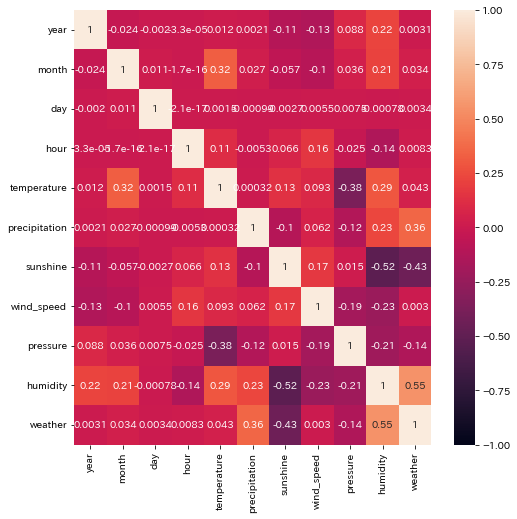

In [15]:
table_corr = df_weather[feature_names].corr()
plt.figure(figsize=(8,8))
sns.heatmap(table_corr,vmin=-1.0, vmax=1.0, annot=True)
plt.show()

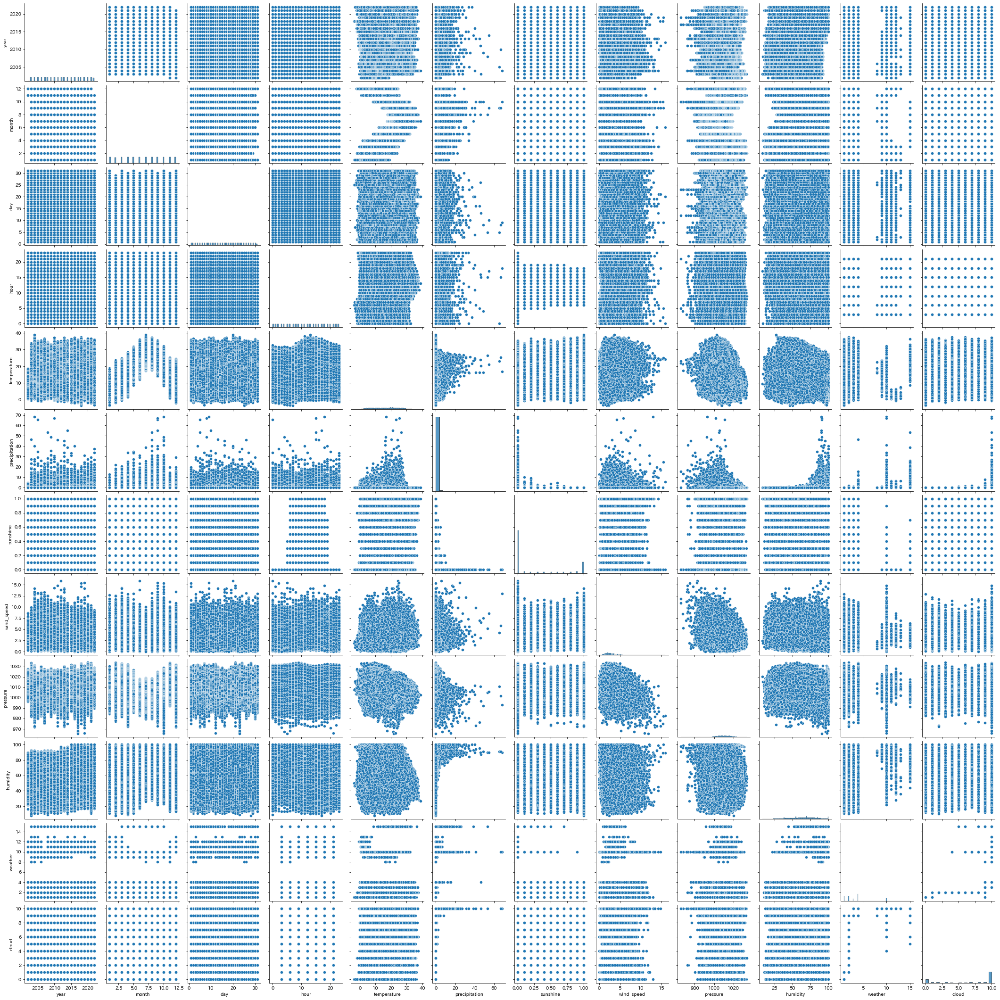

In [183]:
sns.pairplot(df_weather)

In [85]:
# nullがあるところ
df_weather.isnull().sum()

year                   0
month                  0
day                    0
hour                   0
temperature            4
precipitation          0
sunshine           22264
wind_speed            66
wind_direction        66
pressure               4
humidity              51
weather           124185
cloud             124185
dtype: int64

In [86]:
df_weather.isnull().sum()

year                   0
month                  0
day                    0
hour                   0
temperature            4
precipitation          0
sunshine           22264
wind_speed            66
wind_direction        66
pressure               4
humidity              51
weather           124185
cloud             124185
dtype: int64

# Temperature：気温

単位：[℃]

In [62]:
element = "temperature"

element: temperature


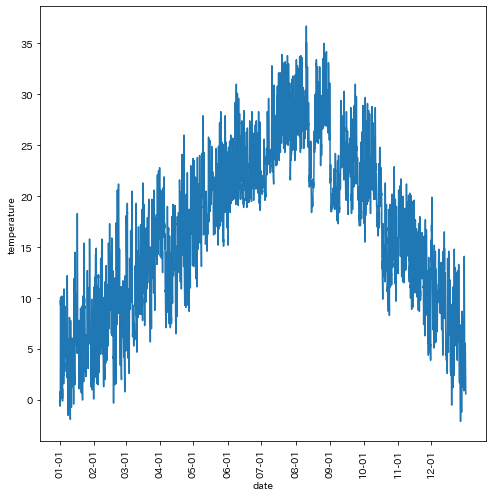

In [63]:
# 折れ線グラフ(2021)
print("element:",element)
condition = df_weather["year"] == 2021
xticks = [ datetime for datetime in df_weather.loc[condition,"datetime"] if "01 00:00:00" in datetime ]
labels = [ datetime[5:10] for datetime in df_weather.loc[condition,"datetime"] if "01 00:00:00" in datetime ]
plt.figure(figsize=(8,8))
plt.plot(df_weather.loc[condition,"datetime"],df_weather.loc[condition,element])
plt.xticks(xticks,labels,rotation=90)
plt.xlabel("date")
plt.ylabel(element)
plt.savefig(f"../data/image/plot_{element}_2021.png")
plt.show()

element: temperature


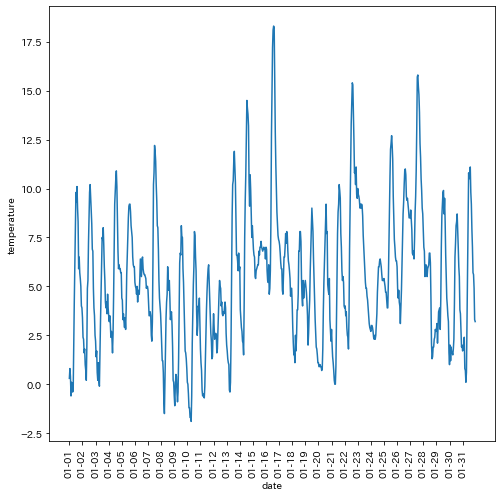

In [14]:
# 折れ線グラフ(2021年1月)
print("element:",element)
condition = (df_weather["year"] == 2021) & (df_weather["month"] == 1)
xticks = [ datetime for datetime in df_weather.loc[condition,"datetime"] if "00:00:00" in datetime ]
labels = [ datetime[5:10] for datetime in df_weather.loc[condition,"datetime"] if "00:00:00" in datetime ]
plt.figure(figsize=(8,8))
plt.plot(df_weather.loc[condition,"datetime"],df_weather.loc[condition,element])
plt.xticks(xticks,labels,rotation=90)
plt.xlabel("date")
plt.ylabel(element)
plt.savefig(f"../data/image/plot_{element}_2021-01.png")
plt.show()

element: temperature


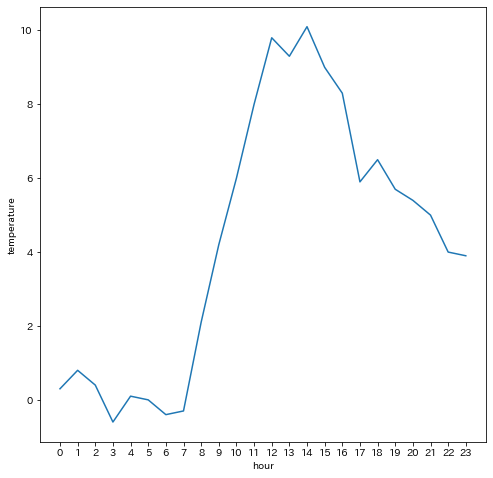

In [15]:
# 折れ線グラフ(2021年1月1日)
print("element:",element)
condition = (df_weather["year"] == 2021) & (df_weather["month"] == 1)& (df_weather["day"] == 1)
plt.figure(figsize=(8,8))
plt.plot(df_weather.loc[condition,"datetime"],df_weather.loc[condition,element])
plt.xticks(df_weather.loc[condition,"datetime"],[i for i in range(24)])
plt.xlabel("hour")
plt.ylabel(element)
plt.savefig(f"../data/image/plot_{element}_2021-01-01.png")
plt.show()

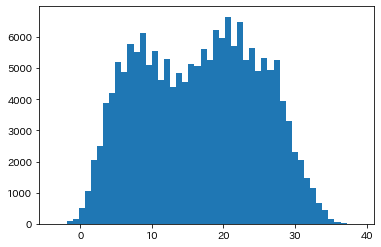

In [271]:
# ヒストグラム
print("element:",element)
plt.hist(df_weather[element],bins=50)
plt.show()

In [229]:
# 全体のブレ
print("element:",element)
df_weather[element].describe()

element: temperature


count    175316.000000
mean         16.581553
std           8.236628
min          -3.600000
25%           9.500000
50%          16.900000
75%          23.200000
max          38.900000
Name: temperature, dtype: float64

In [230]:
# 年ごとのブレ
# 2008年から平均が落ちたのは集計の問題ですな
# 年を経るごとに傾向が変わっていることはなさそう？
print("element:",element)
df_weather.groupby("year", as_index=True).describe()[element].reset_index()

element: temperature


,year,count,mean,std,min,25%,50%,75%,max
0,2002,791.0,7.459418,3.566008,0.4,5.0,7.2,9.600,18.6
1,2003,8760.0,16.053322,7.768876,-0.3,9.3,16.6,22.300,33.9
2,2004,8784.0,17.363160,8.193412,0.3,10.5,17.4,24.400,38.9
3,2005,8760.0,16.253881,8.441237,-0.7,8.5,16.7,23.300,35.2
4,2006,8760.0,16.452683,7.933554,-1.1,9.8,17.1,22.900,35.6
5,2007,8760.0,17.028459,7.743779,0.2,10.0,17.1,23.500,36.5
6,2008,8784.0,16.451480,7.976762,0.3,9.9,16.6,22.900,34.6
7,2009,8760.0,16.732705,7.574498,0.6,9.8,17.6,22.900,33.3
8,2010,8760.0,16.950285,8.748060,-0.3,9.4,16.5,24.800,37.1
9,2011,8760.0,16.516689,8.594283,-1.0,8.6,17.0,23.300,35.0


In [231]:
# 月ごとのブレ
# 2008年から平均が落ちたのは集計の問題ですな
# 年を経るごとに傾向が変わっていることはなさそう？
print("element:",element)
condition = df_weather["year"] > 2008
df_weather[condition].groupby(["month"], as_index=True).describe()[element].reset_index()

element: temperature


,month,count,mean,std,min,25%,50%,75%,max
0,1,10416.0,5.770709,3.140861,-3.6,3.500,5.5,7.8,18.9
1,2,9480.0,6.658766,3.809394,-1.9,3.900,6.2,8.9,23.7
2,3,10416.0,10.262270,4.360150,-0.3,7.000,9.8,13.2,24.8
3,4,10080.0,14.681994,4.335569,1.6,11.700,14.8,17.8,27.7
4,5,10416.0,19.718414,3.554241,8.5,17.275,19.7,22.0,31.9
5,6,10080.0,22.565417,3.324245,12.1,20.300,22.3,24.7,36.0
6,7,10416.0,26.488287,3.442557,17.4,24.200,26.6,28.7,37.4
7,8,10416.0,27.879916,3.253778,17.7,25.900,27.9,30.0,37.3
8,9,10080.0,24.037460,3.580786,14.0,21.400,23.8,26.6,35.5
9,10,10416.0,18.650442,3.796240,8.3,15.900,18.5,21.1,32.1


In [232]:
# 月ごとのブレ
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: temperature


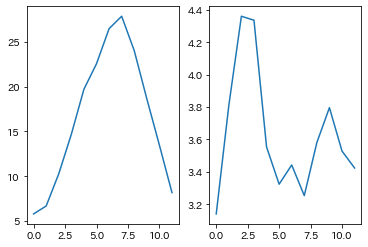

In [233]:
# 年内の気温変化
# そらそうの結果に
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [234]:
# 月日ごとのブレ
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month","day"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: temperature


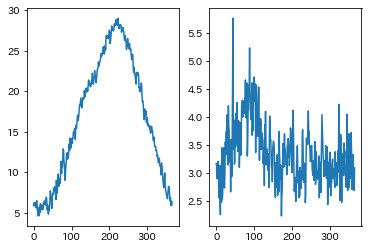

In [235]:
# 年内の日照時間は5~7月と9~10月が少なめ
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [236]:
# 時ごとのブレ
# 20~4までは0確定
# 日中ほどブレやすい
print("element:",element)
df = df_weather[condition]
groupby_columns = ["hour"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)
table

element: temperature


,hour,count,mean,std,min,25%,50%,75%,max
0,0,5081.0,15.331293,7.923988,-1.6,8.200,15.70,21.800,32.7
1,1,5080.0,15.046161,7.974097,-2.0,7.900,15.40,21.500,31.8
2,2,5080.0,14.781909,8.005975,-2.3,7.600,15.20,21.300,31.5
3,3,5080.0,14.529587,8.054254,-2.2,7.275,14.90,21.200,31.3
4,4,5080.0,14.321969,8.085962,-2.9,7.000,14.60,20.925,31.7
5,5,5080.0,14.161969,8.121936,-3.1,6.700,14.45,20.900,31.4
6,6,5080.0,14.228996,8.286319,-3.6,6.600,14.60,21.100,31.1
7,7,5080.0,14.717283,8.537663,-3.5,6.800,15.20,21.725,31.5
8,8,5080.0,15.602795,8.560141,-1.9,7.600,16.10,22.600,32.5
9,9,5080.0,16.636516,8.473670,-0.7,8.800,17.20,23.500,33.5


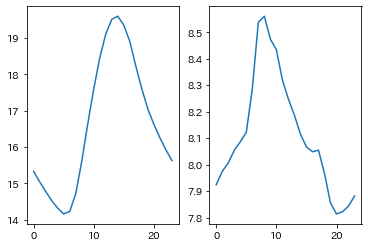

In [237]:
# 朝5時が寒い。昼14時が暑い
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [238]:
# 月時とごとのブレ
# 20~4までは0確定
# 日中ほどブレやすい
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month","hour"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)
table

element: temperature


,month,hour,count,mean,std,min,25%,50%,75%,max
0,1,0,434.0,4.541014,2.334316,-1.6,3.000,4.40,5.900,15.2
1,1,1,434.0,4.217972,2.297574,-2.0,2.800,4.10,5.475,15.4
2,1,2,434.0,3.960138,2.242051,-2.3,2.425,3.90,5.200,15.7
3,1,3,434.0,3.660138,2.246907,-2.2,2.125,3.60,4.900,16.1
4,1,4,434.0,3.436406,2.293230,-2.9,1.825,3.35,4.700,15.6
...,...,...,...,...,...,...,...,...,...,...
283,12,19,403.0,8.756079,2.905122,1.5,6.650,8.50,10.600,21.7
284,12,20,403.0,8.365261,2.929305,1.0,6.300,8.10,10.200,21.5
285,12,21,403.0,8.000248,2.934013,1.4,5.900,7.80,9.900,21.7
286,12,22,403.0,7.642680,2.877112,0.7,5.500,7.40,9.600,19.7


element: temperature


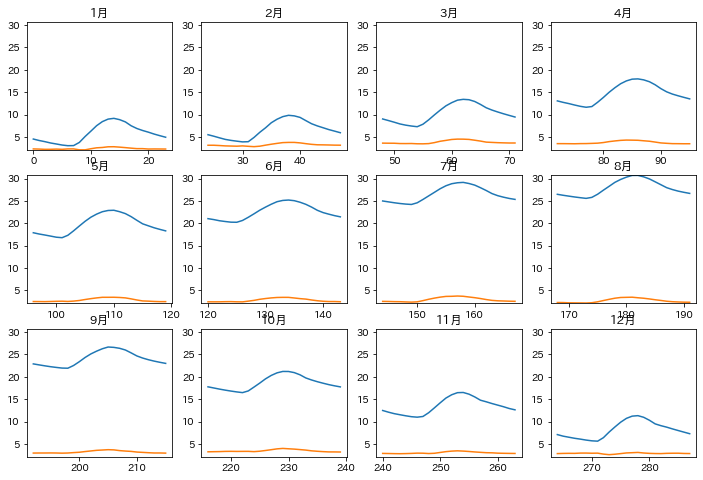

In [239]:
# 高さと幅に違いがあるゾ
print("element:",element)
nrows = 3
ncols = 4
ymin = min(table["mean"].min(),table["std"].min())
ymax = max(table["mean"].max(),table["std"].max())

fig, axes = plt.subplots(nrows=nrows,ncols=ncols, figsize=(12,8))

for month in range(12):
    row = int(month/ncols)
    col = month%ncols
    condition = table["month"] == month+1
    axes[row,col].plot(table.loc[condition,"mean"])
    axes[row,col].plot(table.loc[condition,"std"])
    axes[row,col].set_title(str(month+1)+"月")
    axes[row,col].set_ylim(ymin,ymax)

plt.show()

element: temperature


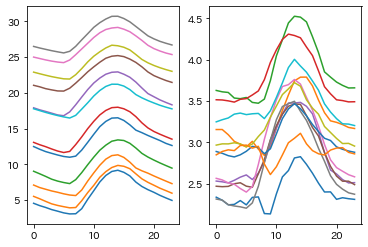

In [240]:
# 月によってばらつき方も違う？
print("element:",element)
fig, ax = plt.subplots(nrows=1,ncols=2)
for month in range(12):
    condition = table["month"] == month+1
    ax[0].plot(table.loc[condition,"mean"].reset_index(drop=True))
    ax[1].plot(table.loc[condition,"std"].reset_index(drop=True))

plt.show()

In [241]:
# 天気がある時間
condition = df_weather["hour"].isin([3,6,9,12,15,18,21])
exist_weather = copy(df_weather[condition])

In [242]:
# 天気ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["weather"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: temperature


In [243]:
# 対応表
weather_sign = {
    1.0: "快晴",
    2.0: "晴れ",
    3.0: "薄雲",
    4.0: "曇り",
    8.0: "霧",
    9.0: "霧雨",
    10.0: "雨",
    11.0: "みぞれ",
    12.0: "雪",
    13.0: "あられ",
    15.0: "雷",
}

In [245]:
# 月時天気ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","weather"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: temperature


In [247]:
# 雲量が関係あるのでしょうか？
print("element:",element)
condition = (table["month"] == 5)
table.loc[condition,["month","hour","weather","count","std"]]

element: temperature


,month,hour,weather,count,std
223,5,9,1.0,98.0,2.694359
224,5,9,2.0,131.0,3.112223
225,5,9,3.0,99.0,2.176514
226,5,9,4.0,201.0,3.126970
227,5,9,9.0,6.0,2.744935
228,5,9,10.0,85.0,2.637599
229,5,12,1.0,99.0,3.275725
230,5,12,2.0,132.0,2.613699
231,5,12,3.0,128.0,2.585301
232,5,12,4.0,169.0,3.406288


element: temperature


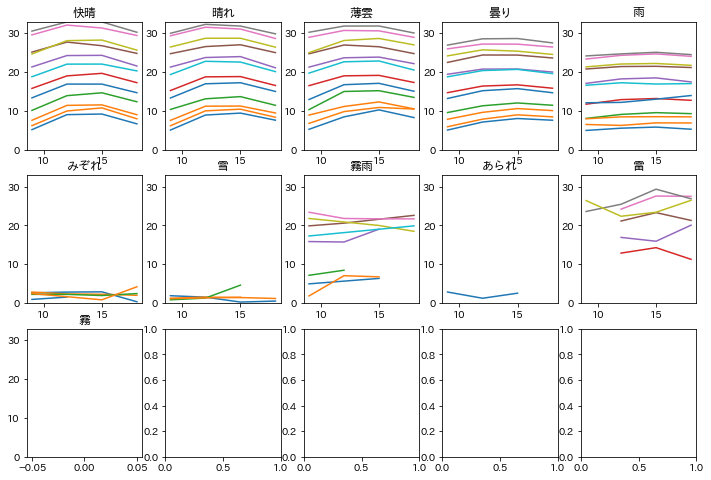

In [252]:
# 定義の曖昧さによるブレなのでは
print("element:",element)

num_glaph = len(table["weather"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,weather in enumerate(table["weather"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["weather"] == weather)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
        ax[row,col].set_title(weather_sign[weather])
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

element: temperature


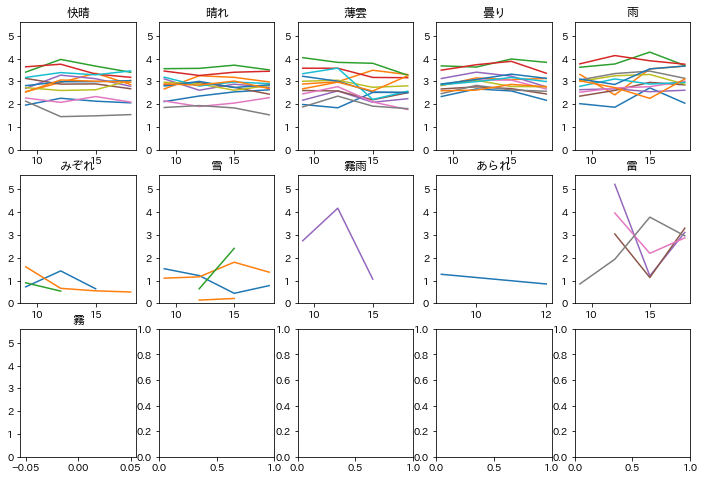

In [251]:
# 定義の曖昧さによるブレなのでは
print("element:",element)

num_glaph = len(table["weather"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,weather in enumerate(table["weather"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["weather"] == weather)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
        ax[row,col].set_title(weather_sign[weather])
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [253]:
# 雲量を0+ → 0, 10- → 10 に変換
df_weather_cloud = copy(df_weather)
search = "([0-9]+)(\+|\-)"
condition_isnull = ~(df_weather["cloud"].isnull())
condition_cloud = df_weather.loc[condition_isnull,"cloud"].map(lambda x: search_object(search,x))
weather_cloud = copy(df_weather[condition_isnull])
weather_cloud.loc[condition_cloud,"cloud"] = \
weather_cloud.loc[condition_cloud,"cloud"].map(lambda x: re.search(search,x).group(1))
df_weather_cloud.loc[condition_isnull,"cloud"] = weather_cloud["cloud"].astype(int)

In [254]:
# 天気がある時間
condition = df_weather_cloud["hour"].isin([3,6,9,12,15,18,21])
exist_weather = copy(df_weather_cloud[condition])

In [255]:
# 月時雲量ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","cloud"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: temperature


In [256]:
# 雲量が関係あるのでしょうか？
print("element:",element)
condition = (table["month"] == 5)
table.loc[condition,["month","hour","cloud","count","std"]]

element: temperature


,month,hour,cloud,count,std
330,5,9,0,76.0,2.693006
331,5,9,1,22.0,2.508272
332,5,9,2,16.0,3.345943
333,5,9,3,21.0,4.099501
334,5,9,4,15.0,3.164867
335,5,9,5,11.0,4.045491
336,5,9,6,19.0,2.732563
337,5,9,7,16.0,2.525924
338,5,9,8,33.0,2.419585
339,5,9,9,30.0,2.480640


element: temperature


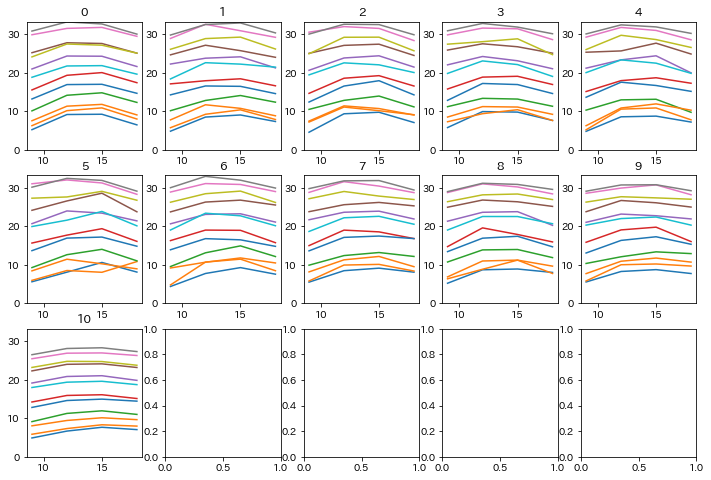

In [258]:
# 定義の曖昧さによるブレなのでは?
print("element:",element)

num_glaph = len(table["cloud"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,cloud in enumerate(table["cloud"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["cloud"] == cloud)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
        ax[row,col].set_title(cloud)
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

element: temperature


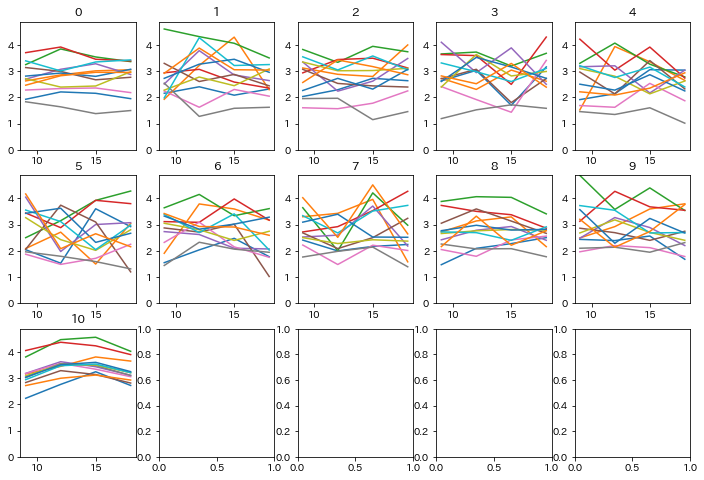

In [259]:
# 定義の曖昧さによるブレなのでは?
print("element:",element)

num_glaph = len(table["cloud"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

# 天気ごとの変化はグラフを複数用意
for num,cloud in enumerate(table["cloud"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["cloud"] == cloud)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
        ax[row,col].set_title(cloud)
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [262]:
# 月時天気雲量ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","weather","cloud"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: temperature


In [263]:
# 雲量が関係あるのでしょうか？
condition = (table["month"] == 5)
table.loc[condition,["month","hour","weather","cloud","count","std"]]

,month,hour,weather,cloud,count,std
505,5,9,1.0,0,76.0,2.693006
506,5,9,1.0,1,22.0,2.508272
507,5,9,2.0,2,16.0,3.345943
508,5,9,2.0,3,21.0,4.099501
509,5,9,2.0,4,15.0,3.164867
...,...,...,...,...,...,...
568,5,18,10.0,8,1.0,NaN
569,5,18,10.0,9,2.0,0.353553
570,5,18,10.0,10,95.0,2.601239
571,5,18,15.0,9,1.0,NaN


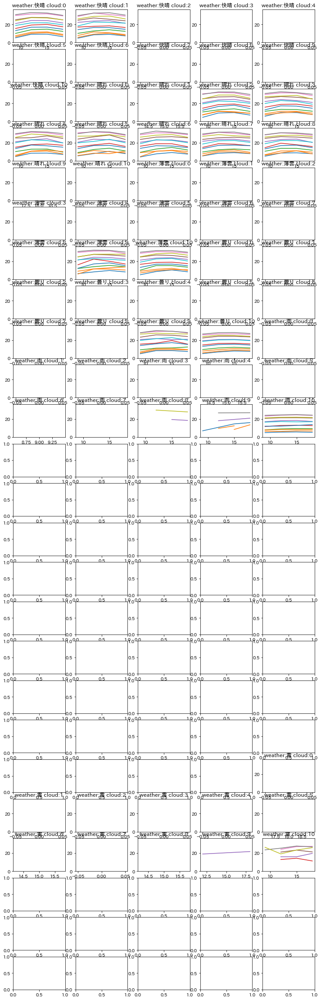

In [269]:
# 定義の曖昧さによるブレなのでは?

num_weather = len(table["weather"].unique())
num_cloud = len(table["cloud"].unique())
num_glaph = num_weather * num_cloud
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,40))

    
# 天気の変化と雲量の変化ごとにグラフを複数用意
for num_w,weather in enumerate(table["weather"].unique()):
    if weather in [8.0,9.0,11.0,12.0,13.0]:
        continue
    
    for num_c,cloud in enumerate(table["cloud"].unique()):
    
        num = num_w * num_cloud + num_c
        col = num%ncols
        row = int(num/ncols)

        # 月ごとの変化は同じグラフ内に
        for month in table["month"].unique():

            condition = (table["month"] == month) & (table["weather"] == weather) & (table["cloud"] == cloud)
            ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
            title = "weather:"+str(weather_sign[weather])+" cloud:"+str(cloud)
            ax[row,col].set_title(title)
            ax[row,col].set_ylim(ymin,ymax)

plt.show()

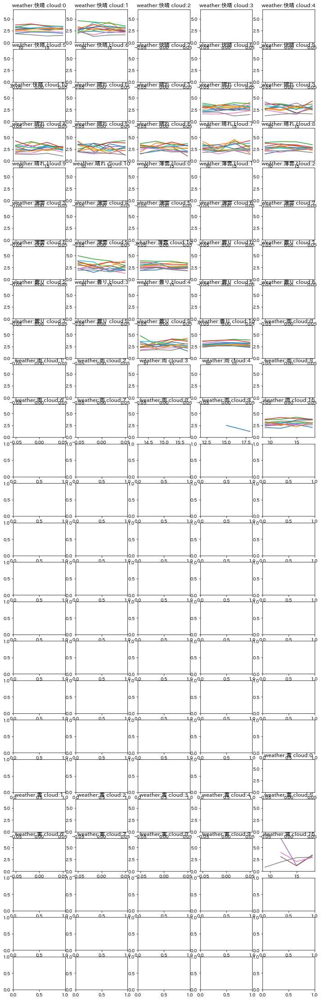

In [270]:
# 定義の曖昧さによるブレなのでは?

num_weather = len(table["weather"].unique())
num_cloud = len(table["cloud"].unique())
num_glaph = num_weather * num_cloud
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,40))

    
# 天気の変化と雲量の変化ごとにグラフを複数用意
for num_w,weather in enumerate(table["weather"].unique()):
    if weather in [8.0,9.0,11.0,12.0,13.0]:
        continue
    
    for num_c,cloud in enumerate(table["cloud"].unique()):
    
        num = num_w * num_cloud + num_c
        col = num%ncols
        row = int(num/ncols)

        # 月ごとの変化は同じグラフ内に
        for month in table["month"].unique():

            condition = (table["month"] == month) & (table["weather"] == weather) & (table["cloud"] == cloud)
            ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
            title = "weather:"+str(weather_sign[weather])+" cloud:"+str(cloud)
            ax[row,col].set_title(title)
            ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [267]:
# 気温の欠損
condition = df_weather["temperature"].isnull()
df_weather[condition]

,year,month,day,hour,temperature,precipitation,sunshine,wind_speed,wind_direction,pressure,humidity,weather,cloud
149124,2019,12,3,13,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
149125,2019,12,3,14,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
149265,2019,12,9,10,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
157258,2020,11,6,11,NaN,0.0,0.0,2.3,北西,1023.9,NaN,NaN,NaN


In [268]:
# 気温の補完方法とは?
df_weather["temperature"].isnull().sum()

4

In [ ]:
# 補完？
# 周りに合わせればよくない？

# Precipitation：降水量

単位：[mm]

In [123]:
element = "precipitation"

element: precipitation


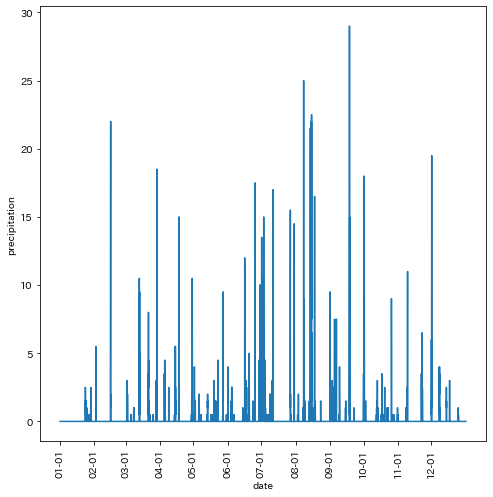

In [124]:
# 折れ線グラフ(2021)
print("element:",element)
condition = df_weather["year"] == 2021
xticks = [ datetime for datetime in df_weather.loc[condition,"datetime"] if "01 00:00:00" in datetime ]
labels = [ datetime[5:10] for datetime in df_weather.loc[condition,"datetime"] if "01 00:00:00" in datetime ]
plt.figure(figsize=(8,8))
plt.plot(df_weather.loc[condition,"datetime"],df_weather.loc[condition,element])
plt.xticks(xticks,labels,rotation=90)
plt.xlabel("date")
plt.ylabel(element)
plt.show()

element: precipitation


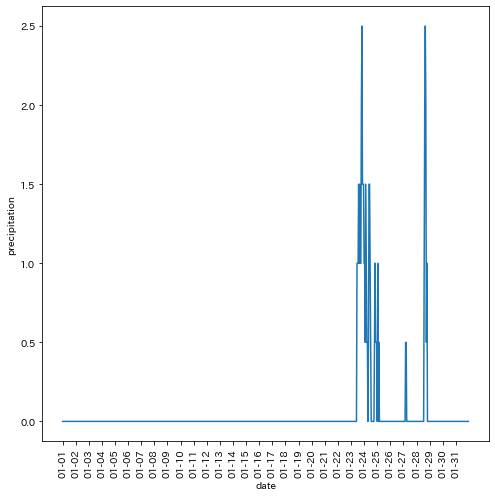

In [125]:
# 折れ線グラフ(2021年1月)
print("element:",element)
condition = (df_weather["year"] == 2021) & (df_weather["month"] == 1)
xticks = [ datetime for datetime in df_weather.loc[condition,"datetime"] if "00:00:00" in datetime ]
labels = [ datetime[5:10] for datetime in df_weather.loc[condition,"datetime"] if "00:00:00" in datetime ]
plt.figure(figsize=(8,8))
plt.plot(df_weather.loc[condition,"datetime"],df_weather.loc[condition,element])
plt.xticks(xticks,labels,rotation=90)
plt.xlabel("date")
plt.ylabel(element)
plt.show()

element: precipitation


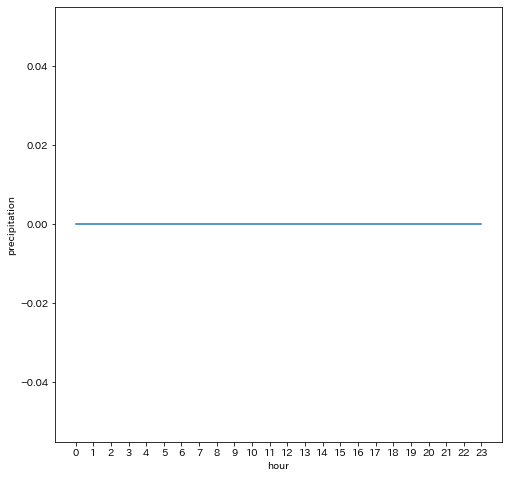

In [126]:
# 折れ線グラフ(2021年1月1日)
print("element:",element)
condition = (df_weather["year"] == 2021) & (df_weather["month"] == 1)& (df_weather["day"] == 1)
plt.figure(figsize=(8,8))
plt.plot(df_weather.loc[condition,"datetime"],df_weather.loc[condition,element])
plt.xticks(df_weather.loc[condition,"datetime"],[i for i in range(24)])
plt.xlabel("hour")
plt.ylabel(element)
plt.show()

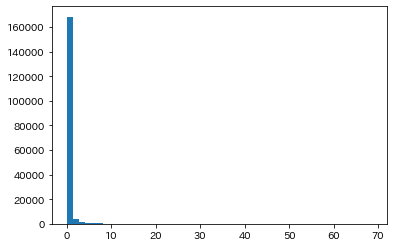

In [304]:
# ヒストグラム
# 基本はまあ振っとらんのですが
# 降水量70mmは何があったんや
print("element:",element)
plt.hist(df_weather[element],bins=50)
plt.show()

In [305]:
# 全体のブレ
print("element:",element)
df_weather[element].describe()

element: precipitation


count    175320.000000
mean          0.191256
std           1.183010
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          68.500000
Name: precipitation, dtype: float64

In [306]:
# 年ごとのブレ
# 2008年から平均が落ちたのは集計の問題ですな
# 年を経るごとに傾向が変わっていることはなさそう？
print("element:",element)
df_weather.groupby("year", as_index=True).describe()[element].reset_index()

element: precipitation


,year,count,mean,std,min,25%,50%,75%,max
0,2002,791.0,0.119469,0.521026,0.0,0.0,0.0,0.0,4.5
1,2003,8760.0,0.211644,1.209791,0.0,0.0,0.0,0.0,46.5
2,2004,8784.0,0.199226,1.391421,0.0,0.0,0.0,0.0,68.5
3,2005,8760.0,0.169178,1.235200,0.0,0.0,0.0,0.0,65.5
4,2006,8760.0,0.198630,1.050141,0.0,0.0,0.0,0.0,26.0
5,2007,8760.0,0.152055,0.968564,0.0,0.0,0.0,0.0,23.5
6,2008,8784.0,0.211464,1.256315,0.0,0.0,0.0,0.0,53.5
7,2009,8760.0,0.205651,1.347185,0.0,0.0,0.0,0.0,49.0
8,2010,8760.0,0.191724,1.294920,0.0,0.0,0.0,0.0,67.0
9,2011,8760.0,0.168893,1.129899,0.0,0.0,0.0,0.0,46.0


In [307]:
# 月ごとのブレ
print("element:",element)
condition = df_weather["year"] > 2008
df_weather[condition].groupby(["month"], as_index=True).describe()[element].reset_index()

element: precipitation


,month,count,mean,std,min,25%,50%,75%,max
0,1,10416.0,0.073637,0.530267,0.0,0.0,0.0,0.0,13.0
1,2,9480.0,0.101846,0.668723,0.0,0.0,0.0,0.0,22.0
2,3,10416.0,0.158362,0.782430,0.0,0.0,0.0,0.0,18.5
3,4,10080.0,0.225992,1.166201,0.0,0.0,0.0,0.0,34.0
4,5,10416.0,0.188796,1.076412,0.0,0.0,0.0,0.0,34.0
5,6,10080.0,0.239137,1.134204,0.0,0.0,0.0,0.0,31.0
6,7,10416.0,0.198301,1.151286,0.0,0.0,0.0,0.0,39.0
7,8,10416.0,0.205885,1.537707,0.0,0.0,0.0,0.0,46.0
8,9,10080.0,0.349355,1.914949,0.0,0.0,0.0,0.0,67.0
9,10,10416.0,0.325797,1.711029,0.0,0.0,0.0,0.0,49.0


In [308]:
# 月ごとのブレ
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: precipitation


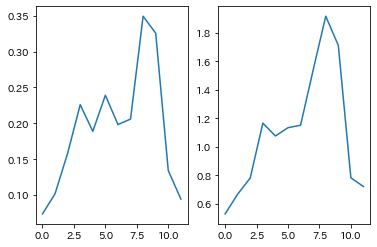

In [309]:
# 年内の降水量変化
# ８～９月が多いらしい　ブレ幅も大きいらしい　さす台風
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [310]:
# 月日ごとのブレ
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month","day"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: precipitation


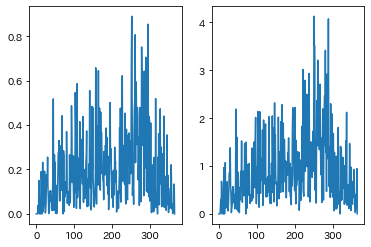

In [311]:
# やはり８～９月　梅雨の5～6月あたりも高めか　11～2月あたりは控え目
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [312]:
# 時ごとのブレ

print("element:",element)
df = df_weather[condition]
groupby_columns = ["hour"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)
table

element: precipitation


,hour,count,mean,std,min,25%,50%,75%,max
0,0,5081.0,0.177918,1.060258,0.0,0.0,0.0,0.0,34.0
1,1,5080.0,0.201969,1.175049,0.0,0.0,0.0,0.0,23.0
2,2,5080.0,0.192815,1.167747,0.0,0.0,0.0,0.0,37.5
3,3,5080.0,0.207185,1.236639,0.0,0.0,0.0,0.0,31.5
4,4,5080.0,0.211319,1.369650,0.0,0.0,0.0,0.0,49.0
5,5,5080.0,0.214173,1.302797,0.0,0.0,0.0,0.0,45.0
6,6,5080.0,0.234843,1.348822,0.0,0.0,0.0,0.0,41.0
7,7,5080.0,0.218701,1.214698,0.0,0.0,0.0,0.0,35.5
8,8,5080.0,0.210335,1.287559,0.0,0.0,0.0,0.0,31.0
9,9,5080.0,0.185925,1.061520,0.0,0.0,0.0,0.0,27.0


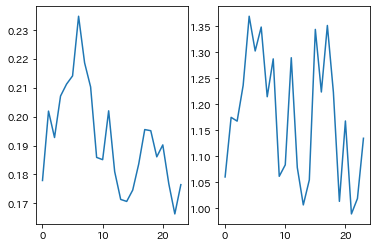

In [313]:
# 体感朝方と夕方に多いのか？日中と夜中は少ないのか？
# どうやら地域差が存在するらしい　東京の夏は夕立が起こりやすいとかなんとか
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [314]:
# 月時とごとのブレ
# 20~4までは0確定
# 日中ほどブレやすい
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month","hour"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)
table

element: precipitation


,month,hour,count,mean,std,min,25%,50%,75%,max
0,1,0,434.0,0.071429,0.452822,0.0,0.0,0.0,0.0,6.5
1,1,1,434.0,0.076037,0.497083,0.0,0.0,0.0,0.0,6.5
2,1,2,434.0,0.063364,0.473324,0.0,0.0,0.0,0.0,7.5
3,1,3,434.0,0.082949,0.607904,0.0,0.0,0.0,0.0,10.0
4,1,4,434.0,0.067972,0.490663,0.0,0.0,0.0,0.0,6.5
...,...,...,...,...,...,...,...,...,...,...
283,12,19,403.0,0.116625,0.783090,0.0,0.0,0.0,0.0,10.5
284,12,20,403.0,0.066998,0.432484,0.0,0.0,0.0,0.0,4.5
285,12,21,403.0,0.062035,0.381308,0.0,0.0,0.0,0.0,4.5
286,12,22,403.0,0.062035,0.354253,0.0,0.0,0.0,0.0,4.0


element: precipitation


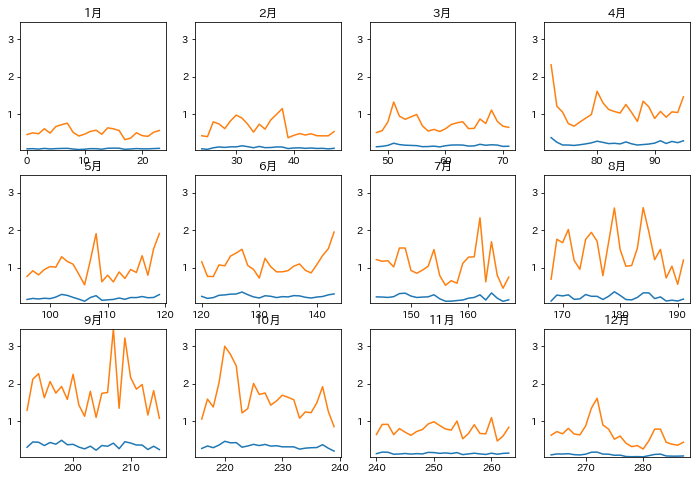

In [315]:
# 季節による差は大きそうですね
print("element:",element)
nrows = 3
ncols = 4
ymin = min(table["mean"].min(),table["std"].min())
ymax = max(table["mean"].max(),table["std"].max())

fig, axes = plt.subplots(nrows=nrows,ncols=ncols, figsize=(12,8))

for month in range(12):
    row = int(month/ncols)
    col = month%ncols
    condition = table["month"] == month+1
    axes[row,col].plot(table.loc[condition,"mean"])
    axes[row,col].plot(table.loc[condition,"std"])
    axes[row,col].set_title(str(month+1)+"月")
    axes[row,col].set_ylim(ymin,ymax)

plt.show()

element: precipitation


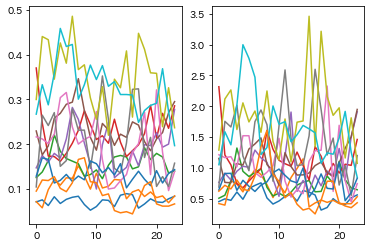

In [316]:
# だいぶぐちゃぐちゃでございますね…
print("element:",element)
fig, ax = plt.subplots(nrows=1,ncols=2)
for month in range(12):
    condition = table["month"] == month+1
    ax[0].plot(table.loc[condition,"mean"].reset_index(drop=True))
    ax[1].plot(table.loc[condition,"std"].reset_index(drop=True))

plt.show()

In [317]:
# 天気がある時間
condition = df_weather["hour"].isin([3,6,9,12,15,18,21])
exist_weather = copy(df_weather[condition])

In [318]:
# 天気ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["weather"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: precipitation


In [319]:
# 対応表
weather_sign = {
    1.0: "快晴",
    2.0: "晴れ",
    3.0: "薄雲",
    4.0: "曇り",
    8.0: "霧",
    9.0: "霧雨",
    10.0: "雨",
    11.0: "みぞれ",
    12.0: "雪",
    13.0: "あられ",
    15.0: "雷",
}

In [320]:
# 月時天気ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","weather"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: precipitation


In [321]:
# 雲量が関係あるのでしょうか？
print("element:",element)
condition = (table["month"] == 5)
table.loc[condition,["month","hour","weather","count","std"]]

element: precipitation


,month,hour,weather,count,std
223,5,9,1.0,98.0,0.000000
224,5,9,2.0,131.0,0.097382
225,5,9,3.0,99.0,0.000000
226,5,9,4.0,201.0,0.473292
227,5,9,9.0,6.0,0.000000
228,5,9,10.0,85.0,1.722584
229,5,12,1.0,99.0,0.000000
230,5,12,2.0,132.0,0.000000
231,5,12,3.0,128.0,0.000000
232,5,12,4.0,169.0,0.100978


element: precipitation


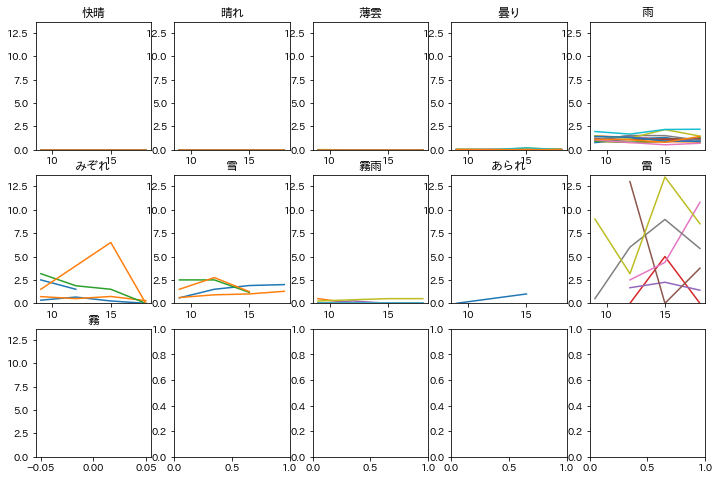

In [322]:
# 定義上、晴れや曇りでは雨降ってないからね。仕方ないね
print("element:",element)

num_glaph = len(table["weather"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,weather in enumerate(table["weather"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["weather"] == weather)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
        ax[row,col].set_title(weather_sign[weather])
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

element: precipitation


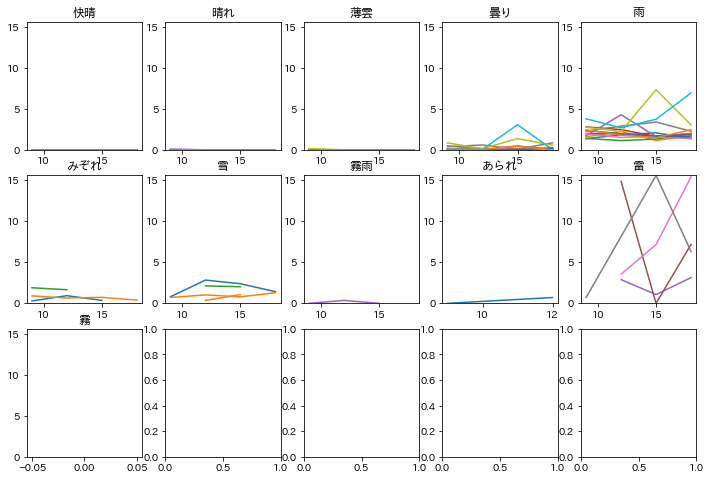

In [323]:
# 定義上、晴れや曇りでは雨降ってないからね。仕方ないね
print("element:",element)

num_glaph = len(table["weather"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,weather in enumerate(table["weather"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["weather"] == weather)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
        ax[row,col].set_title(weather_sign[weather])
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [324]:
# 雲量を0+ → 0, 10- → 10 に変換
df_weather_cloud = copy(df_weather)
search = "([0-9]+)(\+|\-)"
condition_isnull = ~(df_weather["cloud"].isnull())
condition_cloud = df_weather.loc[condition_isnull,"cloud"].map(lambda x: search_object(search,x))
weather_cloud = copy(df_weather[condition_isnull])
weather_cloud.loc[condition_cloud,"cloud"] = \
weather_cloud.loc[condition_cloud,"cloud"].map(lambda x: re.search(search,x).group(1))
df_weather_cloud.loc[condition_isnull,"cloud"] = weather_cloud["cloud"].astype(int)

In [325]:
# 天気がある時間
condition = df_weather_cloud["hour"].isin([3,6,9,12,15,18,21])
exist_weather = copy(df_weather_cloud[condition])

In [326]:
# 月時雲量ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","cloud"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: precipitation


In [327]:
# 雲量が関係あるのでしょうか？
print("element:",element)
condition = (table["month"] == 5)
table.loc[condition,["month","hour","cloud","count","std"]]

element: precipitation


,month,hour,cloud,count,std
330,5,9,0,76.0,0.000000
331,5,9,1,22.0,0.000000
332,5,9,2,16.0,0.000000
333,5,9,3,21.0,0.000000
334,5,9,4,15.0,0.000000
335,5,9,5,11.0,0.301511
336,5,9,6,19.0,0.114708
337,5,9,7,16.0,0.000000
338,5,9,8,33.0,0.000000
339,5,9,9,30.0,0.000000


element: precipitation


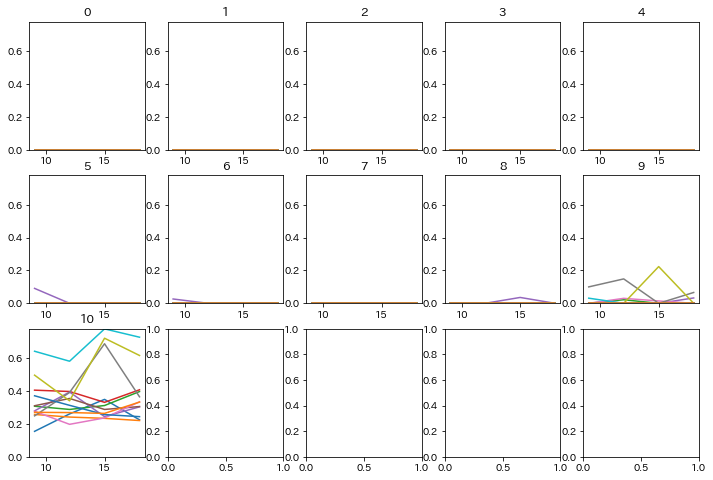

In [328]:
# 定義上、晴れや曇りでは雨降ってないからね。仕方ないね
print("element:",element)

num_glaph = len(table["cloud"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,cloud in enumerate(table["cloud"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & \
            (table["cloud"] == cloud)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
        ax[row,col].set_title(cloud)
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

element: precipitation


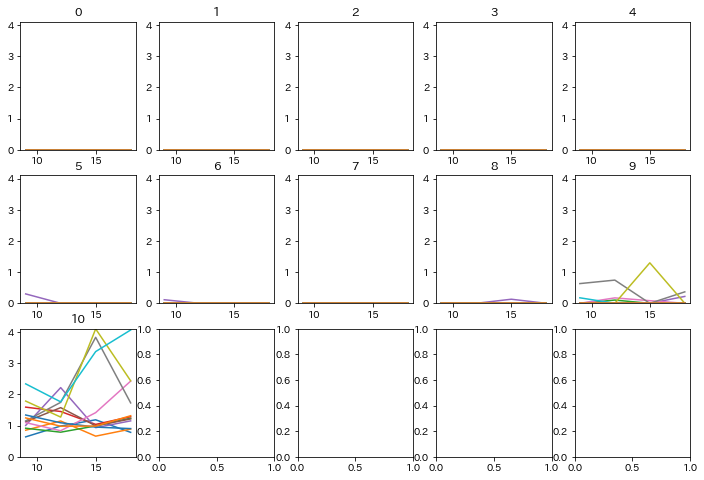

In [329]:
# 定義上、晴れや曇りでは雨降ってないからね。仕方ないね
print("element:",element)

num_glaph = len(table["cloud"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

# 天気ごとの変化はグラフを複数用意
for num,cloud in enumerate(table["cloud"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & \
            (table["cloud"] == cloud)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
        ax[row,col].set_title(cloud)
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [330]:
# 月時天気雲量ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","weather","cloud"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: precipitation


In [331]:
# 雲量が関係あるのでしょうか？
condition = (table["month"] == 5)
table.loc[condition,["month","hour","weather","cloud","count","std"]]

,month,hour,weather,cloud,count,std
505,5,9,1.0,0,76.0,0.000000
506,5,9,1.0,1,22.0,0.000000
507,5,9,2.0,2,16.0,0.000000
508,5,9,2.0,3,21.0,0.000000
509,5,9,2.0,4,15.0,0.000000
...,...,...,...,...,...,...
568,5,18,10.0,8,1.0,NaN
569,5,18,10.0,9,2.0,1.060660
570,5,18,10.0,10,95.0,1.997619
571,5,18,15.0,9,1.0,NaN


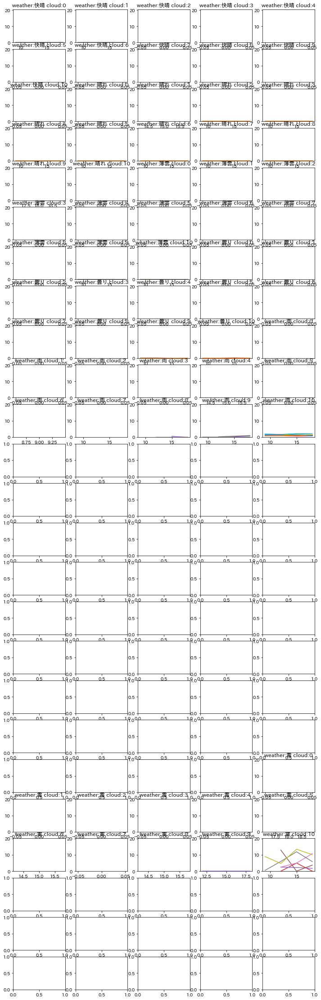

In [332]:
# 定義の曖昧さによるブレなのでは?

num_weather = len(table["weather"].unique())
num_cloud = len(table["cloud"].unique())
num_glaph = num_weather * num_cloud
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,40))

    
# 天気の変化と雲量の変化ごとにグラフを複数用意
for num_w,weather in enumerate(table["weather"].unique()):
    if weather in [8.0,9.0,11.0,12.0,13.0]:
        continue
    
    for num_c,cloud in enumerate(table["cloud"].unique()):
    
        num = num_w * num_cloud + num_c
        col = num%ncols
        row = int(num/ncols)

        # 月ごとの変化は同じグラフ内に
        for month in table["month"].unique():

            condition = (table["month"] == month) & \
                (table["weather"] == weather) & (table["cloud"] == cloud)
            ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
            title = "weather:"+str(weather_sign[weather])+" cloud:"+str(cloud)
            ax[row,col].set_title(title)
            ax[row,col].set_ylim(ymin,ymax)

plt.show()

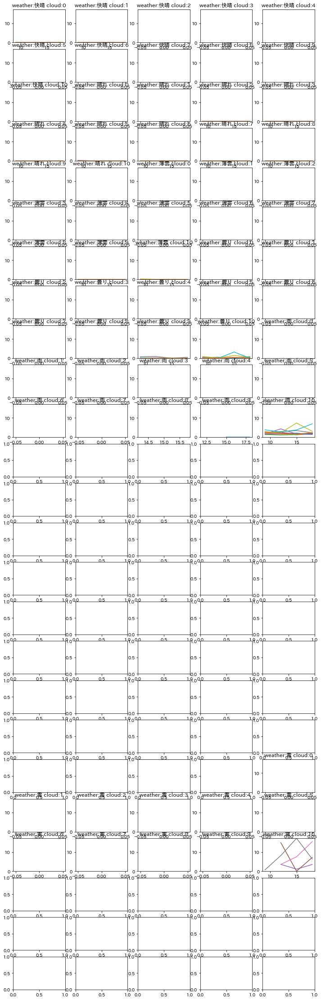

In [333]:
# 定義の曖昧さによるブレなのでは?

num_weather = len(table["weather"].unique())
num_cloud = len(table["cloud"].unique())
num_glaph = num_weather * num_cloud
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,40))

    
# 天気の変化と雲量の変化ごとにグラフを複数用意
for num_w,weather in enumerate(table["weather"].unique()):
    if weather in [8.0,9.0,11.0,12.0,13.0]:
        continue
    
    for num_c,cloud in enumerate(table["cloud"].unique()):
    
        num = num_w * num_cloud + num_c
        col = num%ncols
        row = int(num/ncols)

        # 月ごとの変化は同じグラフ内に
        for month in table["month"].unique():

            condition =  (table["month"] == month) & (table["weather"] == weather) & (table["cloud"] == cloud)
            ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
            title = "weather:"+str(weather_sign[weather])+" cloud:"+str(cloud)
            ax[row,col].set_title(title)
            ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [334]:
# 欠損ありません！凄い！
df_weather['precipitation'].isnull().sum()

0

# Sunshine：日照時間

単位：[時間]　※事実上の割合表記  
nullはそもそも日が出ていない。0は日が出ているが雲に覆われて届いていない

In [127]:
element = "sunshine"

element: sunshine


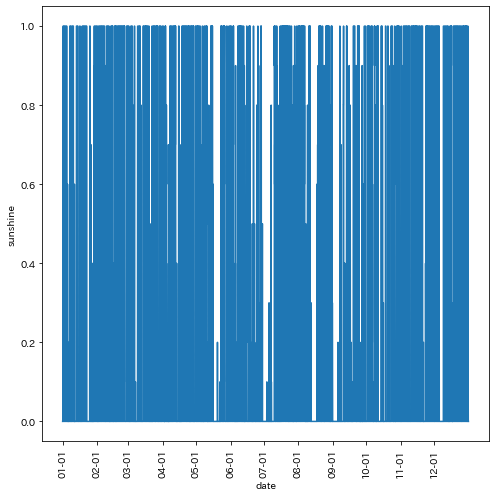

In [128]:
# 折れ線グラフ(2021)
print("element:",element)
condition = df_weather["year"] == 2021
xticks = [ datetime for datetime in df_weather.loc[condition,"datetime"] if "01 00:00:00" in datetime ]
labels = [ datetime[5:10] for datetime in df_weather.loc[condition,"datetime"] if "01 00:00:00" in datetime ]
plt.figure(figsize=(8,8))
plt.plot(df_weather.loc[condition,"datetime"],df_weather.loc[condition,element])
plt.xticks(xticks,labels,rotation=90)
plt.xlabel("date")
plt.ylabel(element)
plt.show()

element: sunshine


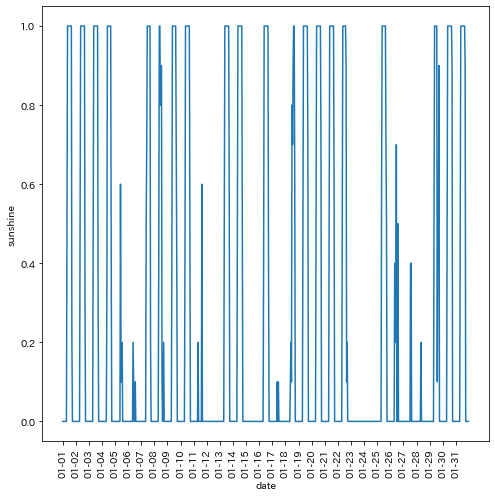

In [129]:
# 折れ線グラフ(2021年1月)
print("element:",element)
condition = (df_weather["year"] == 2021) & (df_weather["month"] == 1)
xticks = [ datetime for datetime in df_weather.loc[condition,"datetime"] if "00:00:00" in datetime ]
labels = [ datetime[5:10] for datetime in df_weather.loc[condition,"datetime"] if "00:00:00" in datetime ]
plt.figure(figsize=(8,8))
plt.plot(df_weather.loc[condition,"datetime"],df_weather.loc[condition,element])
plt.xticks(xticks,labels,rotation=90)
plt.xlabel("date")
plt.ylabel(element)
plt.show()

element: sunshine


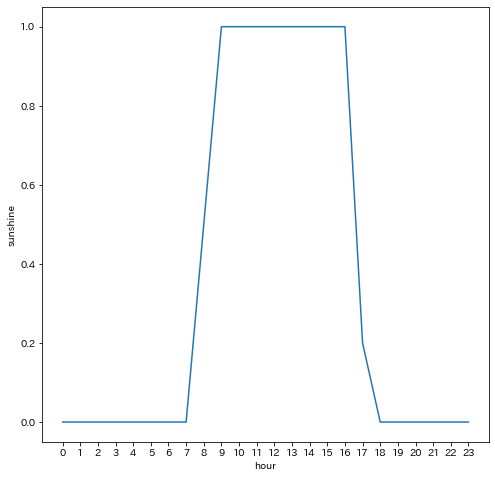

In [130]:
# 折れ線グラフ(2021年1月1日)
print("element:",element)
condition = (df_weather["year"] == 2021) & (df_weather["month"] == 1)& (df_weather["day"] == 1)
plt.figure(figsize=(8,8))
plt.plot(df_weather.loc[condition,"datetime"],df_weather.loc[condition,element])
plt.xticks(df_weather.loc[condition,"datetime"],[i for i in range(24)])
plt.xlabel("hour")
plt.ylabel(element)
plt.show()

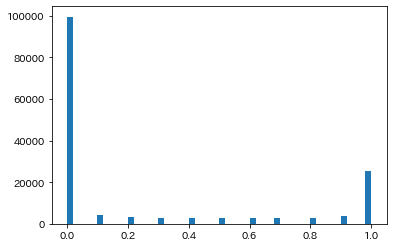

In [462]:
# ヒストグラム
# ０か１かが多い　間は一様に少な目
element = "sunshine"
plt.hist(df_weather[element],bins=50)
plt.show()

In [463]:
# 全体のブレ
print("element:",element)
df_weather[element].describe()

element: sunshine


count    153056.000000
mean          0.256149
std           0.398639
min           0.000000
25%           0.000000
50%           0.000000
75%           0.500000
max           1.000000
Name: sunshine, dtype: float64

In [464]:
# 年ごとのブレ
# 2008年から平均が落ちたのは集計の問題ですな
# 年を経るごとに傾向が変わっていることはなさそう？
print("element:",element)
df_weather.groupby("year", as_index=True).describe()[element].reset_index()

element: sunshine


,year,count,mean,std,min,25%,50%,75%,max
0,2002,363.0,0.401102,0.447089,0.0,0.0,0.1,1.0,1.0
1,2003,4784.0,0.360201,0.431598,0.0,0.0,0.0,0.9,1.0
2,2004,4796.0,0.444683,0.444129,0.0,0.0,0.3,1.0,1.0
3,2005,4784.0,0.410744,0.435472,0.0,0.0,0.2,1.0,1.0
4,2006,4784.0,0.331898,0.422405,0.0,0.0,0.0,0.8,1.0
5,2007,4784.0,0.417224,0.436922,0.0,0.0,0.2,1.0,1.0
6,2008,6896.0,0.269403,0.402077,0.0,0.0,0.0,0.6,1.0
7,2009,8760.0,0.203573,0.369826,0.0,0.0,0.0,0.2,1.0
8,2010,8756.0,0.226930,0.384866,0.0,0.0,0.0,0.3,1.0
9,2011,8760.0,0.234726,0.388521,0.0,0.0,0.0,0.4,1.0


In [465]:
# 月ごとのブレ
print("element:",element)
condition = df_weather["year"] > 2008
df_weather[condition].groupby(["month"], as_index=True).describe()[element].reset_index()

element: sunshine


,month,count,mean,std,min,25%,50%,75%,max
0,1,10416.0,0.268587,0.416169,0.0,0.0,0.0,0.6,1.0
1,2,9474.0,0.241545,0.401518,0.0,0.0,0.0,0.4,1.0
2,3,10415.0,0.245290,0.402124,0.0,0.0,0.0,0.5,1.0
3,4,10080.0,0.262153,0.408265,0.0,0.0,0.0,0.6,1.0
4,5,10403.0,0.265010,0.406348,0.0,0.0,0.0,0.6,1.0
5,6,10080.0,0.190665,0.351436,0.0,0.0,0.0,0.2,1.0
6,7,10402.0,0.211488,0.363030,0.0,0.0,0.0,0.3,1.0
7,8,10416.0,0.241820,0.377487,0.0,0.0,0.0,0.5,1.0
8,9,10075.0,0.182065,0.337855,0.0,0.0,0.0,0.2,1.0
9,10,10416.0,0.174914,0.344274,0.0,0.0,0.0,0.1,1.0


In [466]:
# 月ごとのブレ
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: sunshine


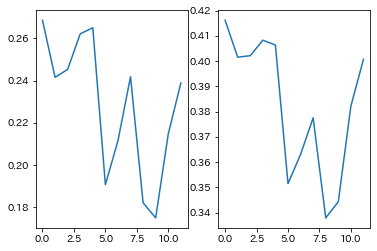

In [467]:
# 年内の日照時間変化
# １と４～５月が多いらしい　６と８～９が少ない
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [468]:
# 月日ごとのブレ
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month","day"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: sunshine


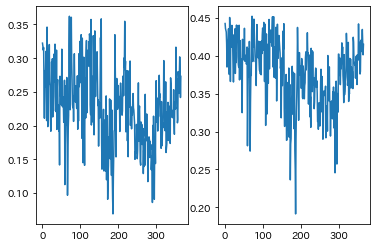

In [469]:
# 傾向は上に同じ
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [470]:
# 時ごとのブレ

print("element:",element)
df = df_weather[condition]
groupby_columns = ["hour"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)
table

element: sunshine


,hour,count,mean,std,min,25%,50%,75%,max
0,0,5081.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
1,1,5080.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
2,2,5080.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
3,3,5080.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
4,4,5078.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
5,5,5076.0,0.000256,0.005431,0.0,0.0,0.0,0.0,0.2
6,6,5073.0,0.075616,0.200224,0.0,0.0,0.0,0.0,1.0
7,7,5072.0,0.227898,0.365728,0.0,0.0,0.0,0.4,1.0
8,8,5073.0,0.416913,0.417964,0.0,0.0,0.3,0.9,1.0
9,9,5078.0,0.500354,0.449437,0.0,0.0,0.5,1.0,1.0


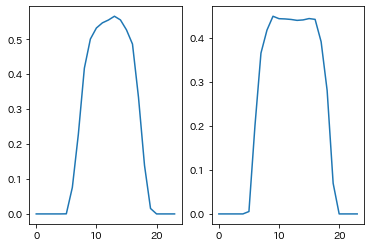

In [471]:
# 似たようなたたずまいしているのが面白い
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [472]:
# 月時とごとのブレ
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month","hour"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)
table

element: sunshine


,month,hour,count,mean,std,min,25%,50%,75%,max
0,1,0,434.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,1,434.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1,2,434.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1,3,434.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1,4,434.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
283,12,19,403.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
284,12,20,403.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
285,12,21,403.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
286,12,22,403.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


element: sunshine


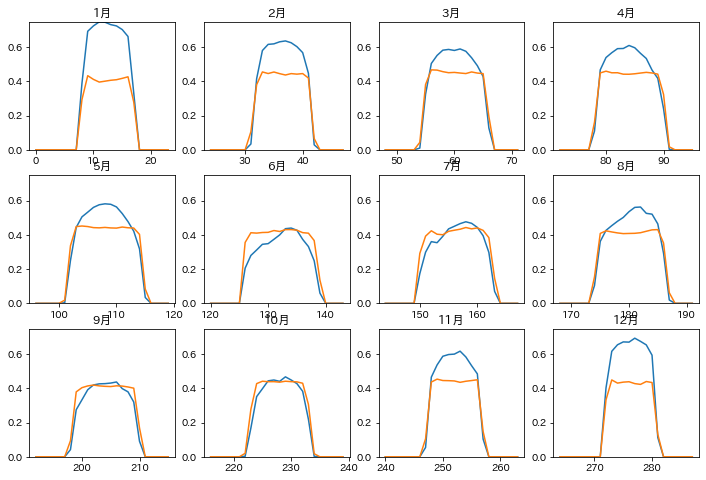

In [473]:
# ９～１７時あたりのブレは横ばいらしい
print("element:",element)
nrows = 3
ncols = 4
ymin = min(table["mean"].min(),table["std"].min())
ymax = max(table["mean"].max(),table["std"].max())

fig, axes = plt.subplots(nrows=nrows,ncols=ncols, figsize=(12,8))

for month in range(12):
    row = int(month/ncols)
    col = month%ncols
    condition = table["month"] == month+1
    axes[row,col].plot(table.loc[condition,"mean"])
    axes[row,col].plot(table.loc[condition,"std"])
    axes[row,col].set_title(str(month+1)+"月")
    axes[row,col].set_ylim(ymin,ymax)

plt.show()

element: sunshine


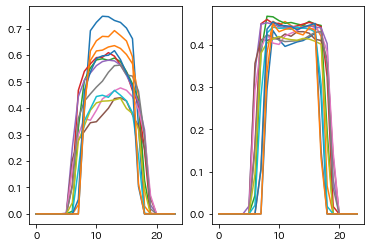

In [474]:
# 季節による差がそれなりにある
# ブレ方に季節差はなさそう
print("element:",element)
fig, ax = plt.subplots(nrows=1,ncols=2)
for month in range(12):
    condition = table["month"] == month+1
    ax[0].plot(table.loc[condition,"mean"].reset_index(drop=True))
    ax[1].plot(table.loc[condition,"std"].reset_index(drop=True))

plt.show()

In [475]:
# 天気がある時間
condition = df_weather["hour"].isin([3,6,9,12,15,18,21])
exist_weather = copy(df_weather[condition])

In [476]:
# 天気ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["weather"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: sunshine


In [477]:
# 対応表
weather_sign = {
    1.0: "快晴",
    2.0: "晴れ",
    3.0: "薄雲",
    4.0: "曇り",
    8.0: "霧",
    9.0: "霧雨",
    10.0: "雨",
    11.0: "みぞれ",
    12.0: "雪",
    13.0: "あられ",
    15.0: "雷",
}

In [478]:
# 月時天気ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","weather"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: sunshine


In [479]:
# 雲量が関係あるのでしょうか？
print("element:",element)
condition = (table["month"] == 5)
table.loc[condition,["month","hour","weather","count","std"]]

element: sunshine


,month,hour,weather,count,std
223,5,9,1.0,98.0,0.014212
224,5,9,2.0,131.0,0.227316
225,5,9,3.0,99.0,0.298536
226,5,9,4.0,200.0,0.204718
227,5,9,9.0,6.0,0.000000
228,5,9,10.0,85.0,0.018562
229,5,12,1.0,99.0,0.000000
230,5,12,2.0,132.0,0.175815
231,5,12,3.0,128.0,0.290969
232,5,12,4.0,169.0,0.230009


element: sunshine


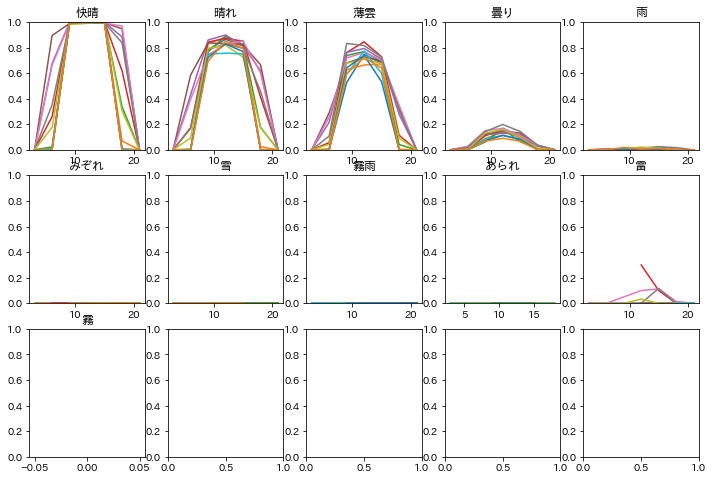

In [480]:
# 晴れの時の分散は日の出と日の入りの時間の差では
print("element:",element)

num_glaph = len(table["weather"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,weather in enumerate(table["weather"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["weather"] == weather)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
        ax[row,col].set_title(weather_sign[weather])
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

element: sunshine


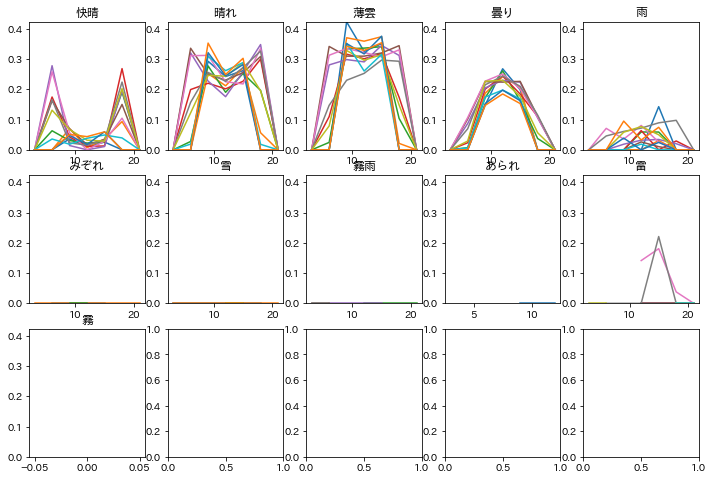

In [481]:
# 晴れの時の分散は日の出と日の入りの時間の差では
print("element:",element)

num_glaph = len(table["weather"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,weather in enumerate(table["weather"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["weather"] == weather)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
        ax[row,col].set_title(weather_sign[weather])
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [482]:
# 雲量を0+ → 0, 10- → 10 に変換
df_weather_cloud = copy(df_weather)
search = "([0-9]+)(\+|\-)"
condition_isnull = ~(df_weather["cloud"].isnull())
condition_cloud = df_weather.loc[condition_isnull,"cloud"].map(lambda x: search_object(search,x))
weather_cloud = copy(df_weather[condition_isnull])
weather_cloud.loc[condition_cloud,"cloud"] = \
weather_cloud.loc[condition_cloud,"cloud"].map(lambda x: re.search(search,x).group(1))
df_weather_cloud.loc[condition_isnull,"cloud"] = weather_cloud["cloud"].astype(int)

In [483]:
# 天気がある時間
condition = df_weather_cloud["hour"].isin([3,6,9,12,15,18,21])
exist_weather = copy(df_weather_cloud[condition])

In [484]:
# 月時雲量ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","cloud"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: sunshine


In [485]:
# 雲量が関係あるのでしょうか？
print("element:",element)
condition = (table["month"] == 5)
table.loc[condition,["month","hour","cloud","count","std"]]

element: sunshine


,month,hour,cloud,count,std
308,5,3,0,75.0,0.0
309,5,3,1,8.0,0.0
310,5,3,2,16.0,0.0
311,5,3,3,18.0,0.0
312,5,3,4,13.0,0.0
...,...,...,...,...,...
380,5,21,6,12.0,0.0
381,5,21,7,11.0,0.0
382,5,21,8,18.0,0.0
383,5,21,9,16.0,0.0


element: sunshine


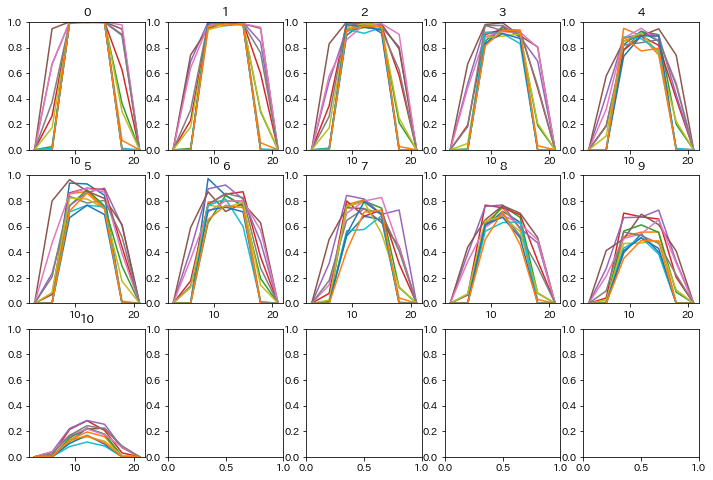

In [486]:
# 晴れの時の分散は日の出と日の入りの時間の差では
# 当然だが雲量によって徐々に日照時間も減る　一応覆われていても0.2くらい光が入るらしい
print("element:",element)

num_glaph = len(table["cloud"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,cloud in enumerate(table["cloud"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["cloud"] == cloud)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
        ax[row,col].set_title(cloud)
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

element: sunshine


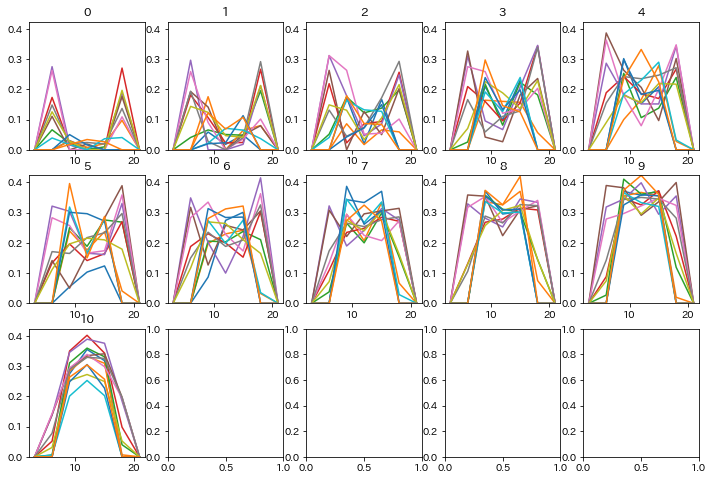

In [487]:
# 晴れの時の分散は日の出と日の入りの時間の差では
# 蜘蛛の足みたいな動き面白い
print("element:",element)

num_glaph = len(table["cloud"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

# 天気ごとの変化はグラフを複数用意
for num,cloud in enumerate(table["cloud"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["cloud"] == cloud)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
        ax[row,col].set_title(cloud)
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [488]:
# 月時天気雲量ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","weather","cloud"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: sunshine


In [489]:
# 雲量が関係あるのでしょうか？
condition = (table["month"] == 5)
table.loc[condition,["month","hour","weather","cloud","count","std"]]

,month,hour,weather,cloud,count,std
473,5,3,1.0,0,75.0,0.0
474,5,3,1.0,1,8.0,0.0
475,5,3,2.0,2,16.0,0.0
476,5,3,2.0,3,18.0,0.0
477,5,3,2.0,4,13.0,0.0
...,...,...,...,...,...,...
584,5,21,4.0,9,6.0,0.0
585,5,21,4.0,10,118.0,0.0
586,5,21,9.0,10,0.0,NaN
587,5,21,10.0,10,73.0,0.0


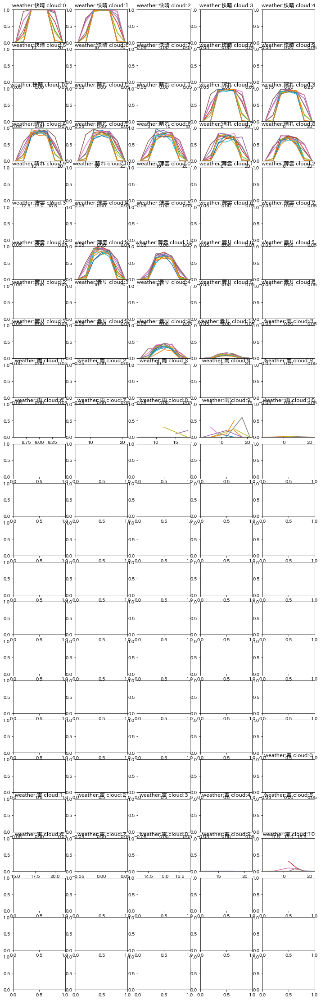

In [490]:
# 定義の曖昧さによるブレなのでは?

num_weather = len(table["weather"].unique())
num_cloud = len(table["cloud"].unique())
num_glaph = num_weather * num_cloud
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,40))

    
# 天気の変化と雲量の変化ごとにグラフを複数用意
for num_w,weather in enumerate(table["weather"].unique()):
    if weather in [8.0,9.0,11.0,12.0,13.0]:
        continue
    
    for num_c,cloud in enumerate(table["cloud"].unique()):
    
        num = num_w * num_cloud + num_c
        col = num%ncols
        row = int(num/ncols)

        # 月ごとの変化は同じグラフ内に
        for month in table["month"].unique():

            condition = (table["month"] == month) & (table["weather"] == weather) & (table["cloud"] == cloud)
            ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
            title = "weather:"+str(weather_sign[weather])+" cloud:"+str(cloud)
            ax[row,col].set_title(title)
            ax[row,col].set_ylim(ymin,ymax)

plt.show()

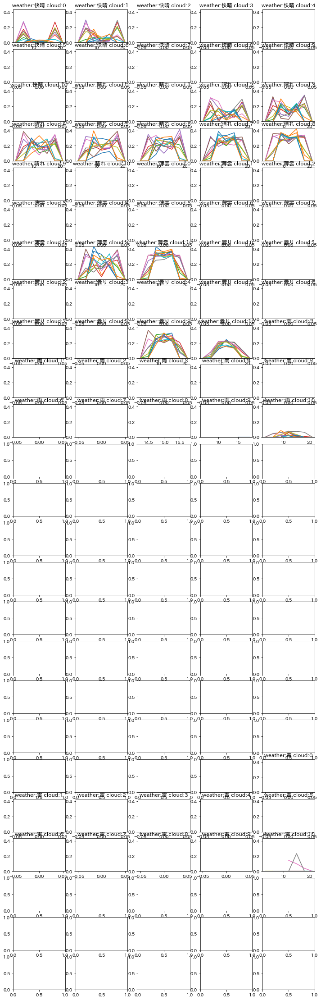

In [491]:
# 定義の曖昧さによるブレなのでは?

num_weather = len(table["weather"].unique())
num_cloud = len(table["cloud"].unique())
num_glaph = num_weather * num_cloud
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,40))

    
# 天気の変化と雲量の変化ごとにグラフを複数用意
for num_w,weather in enumerate(table["weather"].unique()):
    if weather in [8.0,9.0,11.0,12.0,13.0]:
        continue
    
    for num_c,cloud in enumerate(table["cloud"].unique()):
    
        num = num_w * num_cloud + num_c
        col = num%ncols
        row = int(num/ncols)

        # 月ごとの変化は同じグラフ内に
        for month in table["month"].unique():

            condition = (table["month"] == month) & (table["weather"] == weather) & (table["cloud"] == cloud)
            ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
            title = "weather:"+str(weather_sign[weather])+" cloud:"+str(cloud)
            ax[row,col].set_title(title)
            ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [492]:
# ちゃんと観測している時間帯に欠損はないらしい
condition = (df_weather["hour"] >= 7) & (df_weather["hour"] <= 17) & (df_weather["year"] <= 2008)
df_weather.loc[condition,"sunshine"].isnull().sum()

0

In [308]:
# 04/24~08/14 5時から測定開始
# 03/12~04/23 08/15~10/28 6時から測定開始
# 10/29~03/11 7時から測定開始

# 10/20~01/27 17時まで測定
# 01/28~03/30 09/08~10/19 18時まで測定
# 04/01~ 19まで測定

# 2008/06/25の1時から、日が出ていない時間でも0.0にするようになったらしい
i =48850
df_weather.loc[i:i+50]

,year,month,day,hour,temperature,precipitation,sunshine,wind_speed,wind_direction,pressure,humidity,weather,cloud
48850,2008,6,25,11,22.4,0.0,0.0,0.8,北東,1002.7,67.0,NaN,NaN
48851,2008,6,25,12,23.5,0.0,0.1,3.7,北東,1001.9,63.0,3.0,10
48852,2008,6,25,13,23.7,0.0,0.3,1.8,北,1001.8,62.0,NaN,NaN
48853,2008,6,25,14,24.2,0.0,0.5,2.0,東北東,1001.2,61.0,NaN,NaN
48854,2008,6,25,15,24.5,0.0,0.1,3.0,東北東,1001.0,62.0,4.0,10
48855,2008,6,25,16,23.6,0.0,0.0,3.2,東北東,1000.9,65.0,NaN,NaN
48856,2008,6,25,17,23.0,0.0,0.5,3.7,東北東,1001.4,67.0,NaN,NaN
48857,2008,6,25,18,22.0,0.0,0.0,3.2,東北東,1002.1,70.0,3.0,10
48858,2008,6,25,19,21.3,0.0,0.0,3.2,東北東,1002.9,70.0,NaN,NaN
48859,2008,6,25,20,20.1,0.0,0.0,2.6,東北東,1002.9,74.0,NaN,NaN


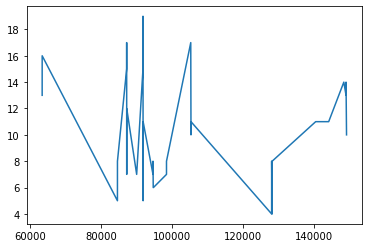

In [311]:
# 2008年6月25日の1時以降の欠損
df_weather_copy = df_weather.loc[48850:]
condition = df_weather_copy["sunshine"].isnull()
plt.plot(df_weather_copy.loc[condition,'hour'])
plt.show()

In [312]:
# この56個の補完方法とは？
df_weather_copy["sunshine"].isnull().sum()

56

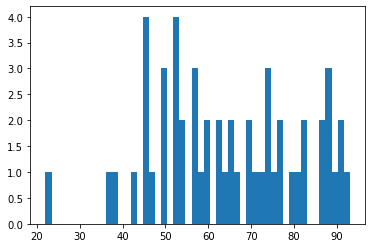

In [313]:
# 時間帯の規則性はなさそう
# 天気が悪いわけではない
# 曇っていることが多い（晴れている日もある）
# 北風が多いらしい
# 他規則性らしいものは感じない
condition = df_weather_copy["sunshine"].isnull()
plt.hist(df_weather_copy.loc[condition,"humidity"],bins=50)
plt.show()

In [ ]:
# 補完案：
# 同じ年月時の同じ天候で補完するとかが妥当か？
# 月と時で傾向が変わるのはわかる　日で変わるのはわからない？月とセットならわかる
# 天候や雲量で変わるのはわかる
# 地球温暖化とか考えれば年によって変わるのはわかる
# 他は小数の連続値なのでgroupbyは不可。関連性もわからん

# Wind Speed：風速

単位：[m/s]

In [131]:
element = "wind_speed"

element: wind_speed


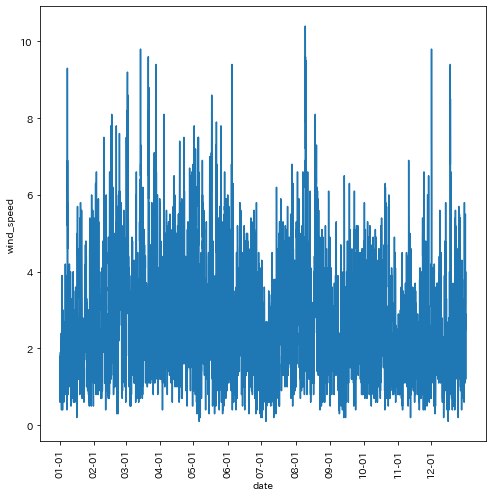

In [132]:
# 折れ線グラフ(2021)
print("element:",element)
condition = df_weather["year"] == 2021
xticks = [ datetime for datetime in df_weather.loc[condition,"datetime"] if "01 00:00:00" in datetime ]
labels = [ datetime[5:10] for datetime in df_weather.loc[condition,"datetime"] if "01 00:00:00" in datetime ]
plt.figure(figsize=(8,8))
plt.plot(df_weather.loc[condition,"datetime"],df_weather.loc[condition,element])
plt.xticks(xticks,labels,rotation=90)
plt.xlabel("date")
plt.ylabel(element)
plt.show()

element: wind_speed


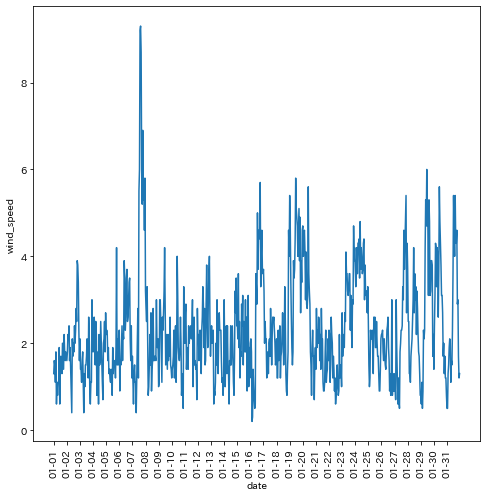

In [133]:
# 折れ線グラフ(2021年1月)
print("element:",element)
condition = (df_weather["year"] == 2021) & (df_weather["month"] == 1)
xticks = [ datetime for datetime in df_weather.loc[condition,"datetime"] if "00:00:00" in datetime ]
labels = [ datetime[5:10] for datetime in df_weather.loc[condition,"datetime"] if "00:00:00" in datetime ]
plt.figure(figsize=(8,8))
plt.plot(df_weather.loc[condition,"datetime"],df_weather.loc[condition,element])
plt.xticks(xticks,labels,rotation=90)
plt.xlabel("date")
plt.ylabel(element)
plt.show()

element: wind_speed


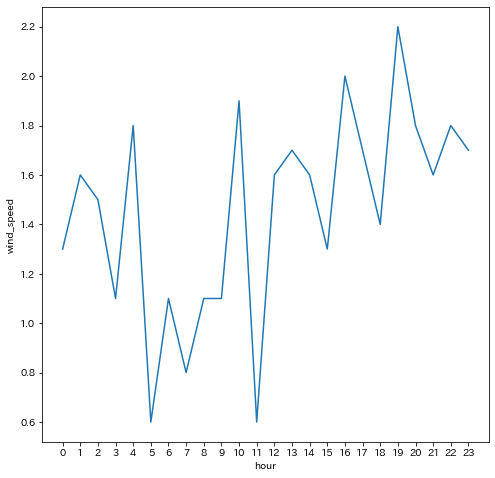

In [134]:
# 折れ線グラフ(2021年1月1日)
print("element:",element)
condition = (df_weather["year"] == 2021) & (df_weather["month"] == 1)& (df_weather["day"] == 1)
plt.figure(figsize=(8,8))
plt.plot(df_weather.loc[condition,"datetime"],df_weather.loc[condition,element])
plt.xticks(df_weather.loc[condition,"datetime"],[i for i in range(24)])
plt.xlabel("hour")
plt.ylabel(element)
plt.show()

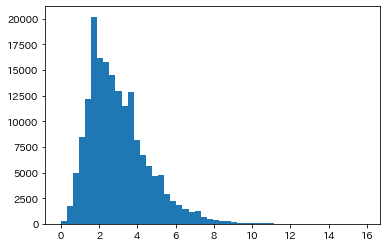

In [525]:
# ヒストグラム
# 基本はまあ振っとらんのですが
# 降水量70mmは何があったんや
element = "wind_speed"
plt.hist(df_weather[element],bins=50)
plt.show()

In [526]:
# 全体のブレ
print("element:",element)
df_weather[element].describe()

element: wind_speed


count    175254.000000
mean          3.008479
std           1.569540
min           0.000000
25%           1.900000
50%           2.700000
75%           3.800000
max          15.900000
Name: wind_speed, dtype: float64

In [527]:
# 年ごとのブレ
# 年を経るごとに風速が落ちている？
print("element:",element)
df_weather.groupby("year", as_index=True).describe()[element].reset_index()

element: wind_speed


,year,count,mean,std,min,25%,50%,75%,max
0,2002,791.0,2.961062,1.393103,0.3,1.9,2.8,3.8,8.7
1,2003,8753.0,3.145813,1.476675,0.1,2.1,2.9,4.0,9.9
2,2004,8784.0,3.659495,1.914038,0.2,2.3,3.4,4.7,14.2
3,2005,8760.0,3.453961,1.752936,0.1,2.2,3.2,4.5,13.1
4,2006,8756.0,3.435233,1.801011,0.1,2.1,3.1,4.4,13.2
5,2007,8760.0,3.390731,1.735865,0.2,2.2,3.1,4.3,13.3
6,2008,8780.0,2.816424,1.407643,0.2,1.8,2.6,3.6,12.6
7,2009,8760.0,2.924692,1.514534,0.1,1.8,2.6,3.7,11.6
8,2010,8760.0,2.916826,1.483043,0.1,1.8,2.7,3.7,14.3
9,2011,8760.0,2.927751,1.528871,0.1,1.8,2.6,3.7,14.8


In [528]:
# 月ごとのブレ
print("element:",element)
condition = df_weather["year"] > 2008
df_weather[condition].groupby(["month"], as_index=True).describe()[element].reset_index()

element: wind_speed


,month,count,mean,std,min,25%,50%,75%,max
0,1,10415.0,2.712645,1.386638,0.0,1.7,2.4,3.4,9.6
1,2,9480.0,2.914399,1.485599,0.3,1.9,2.6,3.7,11.0
2,3,10403.0,3.138143,1.643172,0.0,1.9,2.8,4.0,14.3
3,4,10079.0,3.288382,1.697146,0.1,2.0,3.0,4.2,12.0
4,5,10411.0,3.181942,1.572747,0.1,2.0,2.9,4.2,10.8
5,6,10080.0,2.835278,1.431829,0.0,1.8,2.6,3.7,15.9
6,7,10406.0,3.030040,1.590841,0.0,1.8,2.7,4.0,10.0
7,8,10416.0,3.025614,1.486677,0.0,1.9,2.8,3.9,11.0
8,9,10080.0,2.764048,1.377462,0.0,1.8,2.5,3.4,15.4
9,10,10416.0,2.667012,1.313003,0.1,1.8,2.4,3.2,15.3


In [529]:
# 月ごとのブレ
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: wind_speed


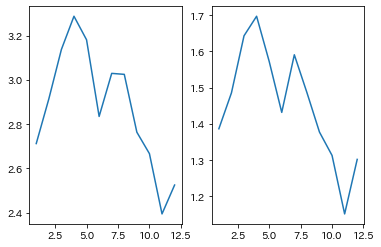

In [530]:
# 年内の風速変化
# ３～５月が風強め　ブレ幅も大きいらしい　花粉が…
# 冬は風が穏やかですね
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["month"],table["mean"])
ax[1].plot(table["month"],table["std"])
plt.show()

In [499]:
# 月日ごとのブレ
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month","day"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: wind_speed


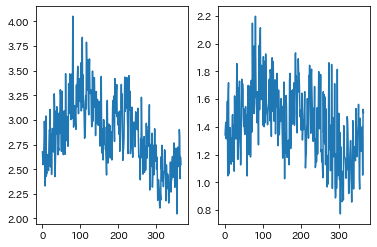

In [500]:
# やはり８～９月　梅雨の5～6月あたりも高めか　11～2月あたりは控え目
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [501]:
# 時ごとのブレ

print("element:",element)
df = df_weather[condition]
groupby_columns = ["hour"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)
table

element: wind_speed


,hour,count,mean,std,min,25%,50%,75%,max
0,0,5080.0,2.641811,1.330247,0.2,1.7,2.4,3.2,15.9
1,1,5079.0,2.547883,1.287293,0.0,1.7,2.3,3.1,14.6
2,2,5079.0,2.503938,1.268594,0.0,1.7,2.3,3.1,15.3
3,3,5079.0,2.434515,1.278082,0.0,1.6,2.2,3.0,12.2
4,4,5077.0,2.400532,1.261278,0.0,1.6,2.2,3.0,12.1
5,5,5077.0,2.347114,1.263541,0.0,1.5,2.1,2.8,15.4
6,6,5077.0,2.320150,1.241652,0.1,1.5,2.0,2.8,14.2
7,7,5077.0,2.358479,1.264980,0.2,1.5,2.1,2.9,13.9
8,8,5077.0,2.478767,1.350630,0.1,1.5,2.2,3.1,13.3
9,9,5079.0,2.644438,1.438985,0.4,1.6,2.3,3.3,11.5


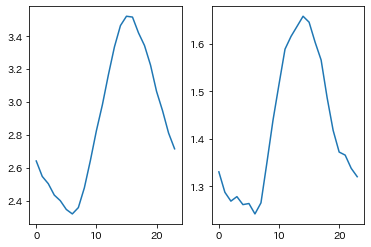

In [502]:
# 日中が風強め　夜中が風弱め
# 太陽光によって地表が温まり地表と上空の空気が混ざりやすいんだとか
# 上空は風が強いことが多く、地表と混ざれば地表の風も強くなるらしい　へぇー
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [503]:
# 月時とごとのブレ
# 20~4までは0確定
# 日中ほどブレやすい
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month","hour"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)
table

element: wind_speed


,month,hour,count,mean,std,min,25%,50%,75%,max
0,1,0,434.0,2.584332,1.256147,0.4,1.7,2.4,3.100,9.1
1,1,1,434.0,2.505530,1.121475,0.4,1.8,2.4,3.100,6.7
2,1,2,434.0,2.556682,1.149179,0.5,1.8,2.4,3.200,7.4
3,1,3,434.0,2.500691,1.207970,0.2,1.6,2.2,3.000,8.6
4,1,4,434.0,2.464286,1.127605,0.2,1.7,2.3,3.100,8.3
...,...,...,...,...,...,...,...,...,...,...
283,12,19,402.0,2.682090,1.379861,0.4,1.7,2.5,3.475,8.0
284,12,20,403.0,2.573449,1.323332,0.3,1.6,2.4,3.200,8.4
285,12,21,403.0,2.575931,1.295511,0.1,1.7,2.4,3.200,9.3
286,12,22,403.0,2.465261,1.218732,0.2,1.6,2.3,3.200,8.6


element: wind_speed


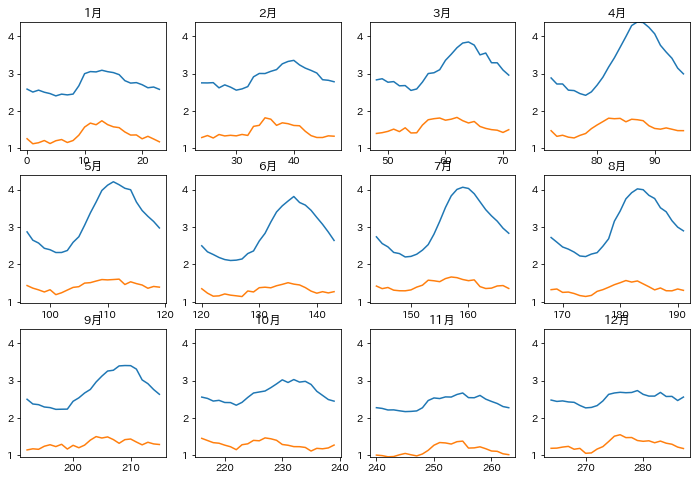

In [504]:
# 季節による差は大きそうですね
# 風速は温度差による影響が大きい　寒暖差が大きい4～5月が風強め（秋は？）
# 冬は季節風が吹くので風がそこそこ強い傾向があるらしいが…？
# 季節風の影響で寒暖差が発生しやすいのが冬と春らしい？
# 地域差もあり、日本海側は冬の季節風の影響を受けやすい。太平洋側は夏の季節風（偏西風？）の影響を受けやすい。
# 参考資料：https://detail.chiebukuro.yahoo.co.jp/qa/question_detail/q1448178614
print("element:",element)
nrows = 3
ncols = 4
ymin = min(table["mean"].min(),table["std"].min())
ymax = max(table["mean"].max(),table["std"].max())

fig, axes = plt.subplots(nrows=nrows,ncols=ncols, figsize=(12,8))

for month in range(12):
    row = int(month/ncols)
    col = month%ncols
    condition = table["month"] == month+1
    axes[row,col].plot(table.loc[condition,"mean"])
    axes[row,col].plot(table.loc[condition,"std"])
    axes[row,col].set_title(str(month+1)+"月")
    axes[row,col].set_ylim(ymin,ymax)

plt.show()

element: wind_speed


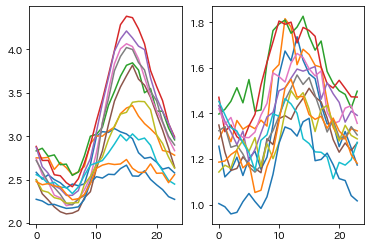

In [505]:
# だいぶぐちゃぐちゃでございますね…
print("element:",element)
fig, ax = plt.subplots(nrows=1,ncols=2)
for month in range(12):
    condition = table["month"] == month+1
    ax[0].plot(table.loc[condition,"mean"].reset_index(drop=True))
    ax[1].plot(table.loc[condition,"std"].reset_index(drop=True))

plt.show()

In [506]:
# 天気がある時間
condition = df_weather["hour"].isin([3,6,9,12,15,18,21])
exist_weather = copy(df_weather[condition])

In [507]:
# 天気ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["weather"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: wind_speed


In [508]:
# 対応表
weather_sign = {
    1.0: "快晴",
    2.0: "晴れ",
    3.0: "薄雲",
    4.0: "曇り",
    8.0: "霧",
    9.0: "霧雨",
    10.0: "雨",
    11.0: "みぞれ",
    12.0: "雪",
    13.0: "あられ",
    15.0: "雷",
}

In [509]:
# 月時天気ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","weather"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: wind_speed


In [510]:
# 雲量が関係あるのでしょうか？
print("element:",element)
condition = (table["month"] == 5)
table.loc[condition,["month","hour","weather","count","std"]]

element: wind_speed


,month,hour,weather,count,std
210,5,3,1.0,109.0,1.124418
211,5,3,2.0,121.0,1.395118
212,5,3,3.0,77.0,1.070834
213,5,3,4.0,220.0,1.394987
214,5,3,9.0,4.0,1.854724
215,5,3,10.0,88.0,1.804169
216,5,3,15.0,1.0,NaN
217,5,6,1.0,99.0,1.379239
218,5,6,2.0,110.0,1.315141
219,5,6,3.0,94.0,1.090894


element: wind_speed


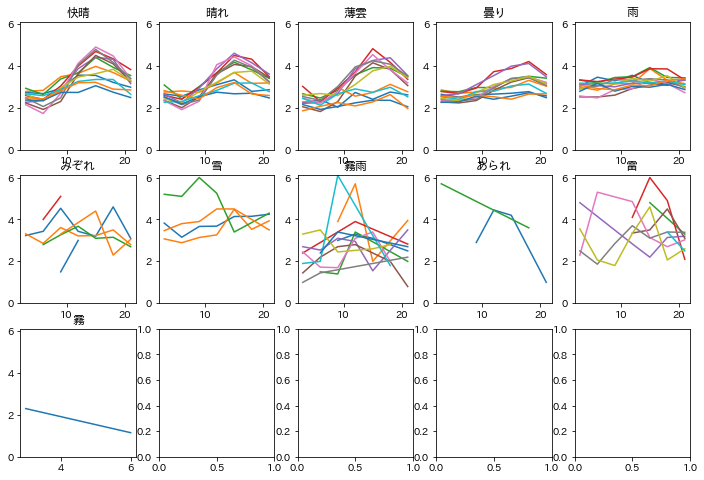

In [511]:
# 定義上、晴れや曇りでは雨降ってないからね。仕方ないね
print("element:",element)

num_glaph = len(table["weather"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,weather in enumerate(table["weather"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["weather"] == weather)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
        ax[row,col].set_title(weather_sign[weather])
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

element: wind_speed


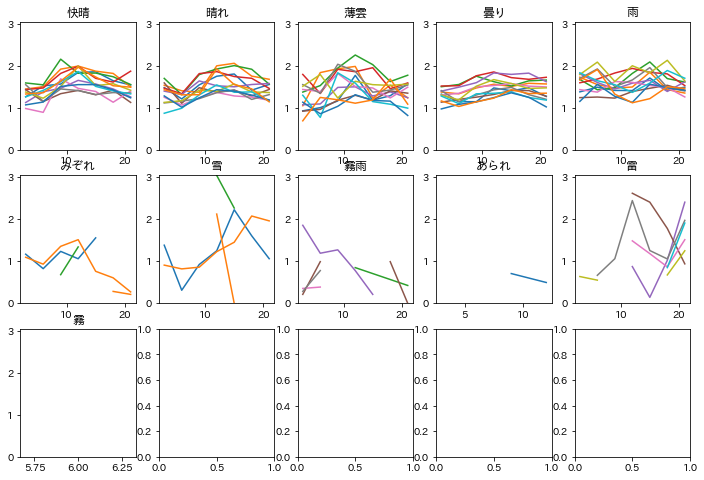

In [512]:
# 定義の曖昧さによるブレなのでは
print("element:",element)

num_glaph = len(table["weather"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,weather in enumerate(table["weather"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["weather"] == weather)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
        ax[row,col].set_title(weather_sign[weather])
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [513]:
# 雲量を0+ → 0, 10- → 10 に変換
df_weather_cloud = copy(df_weather)
search = "([0-9]+)(\+|\-)"
condition_isnull = ~(df_weather["cloud"].isnull())
condition_cloud = df_weather.loc[condition_isnull,"cloud"].map(lambda x: search_object(search,x))
weather_cloud = copy(df_weather[condition_isnull])
weather_cloud.loc[condition_cloud,"cloud"] = \
weather_cloud.loc[condition_cloud,"cloud"].map(lambda x: re.search(search,x).group(1))
df_weather_cloud.loc[condition_isnull,"cloud"] = weather_cloud["cloud"].astype(int)

In [514]:
# 天気がある時間
condition = df_weather_cloud["hour"].isin([3,6,9,12,15,18,21])
exist_weather = copy(df_weather_cloud[condition])

In [515]:
# 月時雲量ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","cloud"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: wind_speed


In [516]:
# 雲量が関係あるのでしょうか？
print("element:",element)
condition = (table["month"] == 5)
table.loc[condition,["month","hour","cloud","count","std"]]

element: wind_speed


,month,hour,cloud,count,std
308,5,3,0,100.0,1.155813
309,5,3,1,9.0,0.474342
310,5,3,2,20.0,0.842599
311,5,3,3,27.0,1.457205
312,5,3,4,16.0,0.817695
...,...,...,...,...,...
380,5,21,6,12.0,1.347135
381,5,21,7,22.0,1.541153
382,5,21,8,24.0,1.553345
383,5,21,9,21.0,1.880400


element: wind_speed


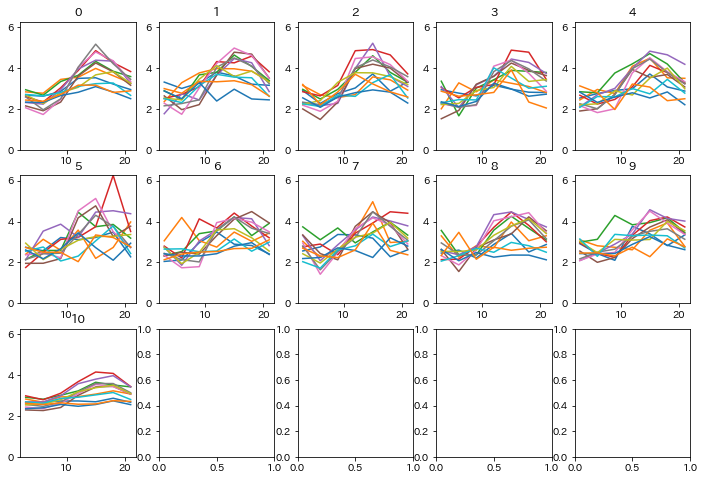

In [517]:
# 定義の曖昧さによるブレなのでは?
print("element:",element)

num_glaph = len(table["cloud"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,cloud in enumerate(table["cloud"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & \
            (table["cloud"] == cloud)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
        ax[row,col].set_title(cloud)
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

element: wind_speed


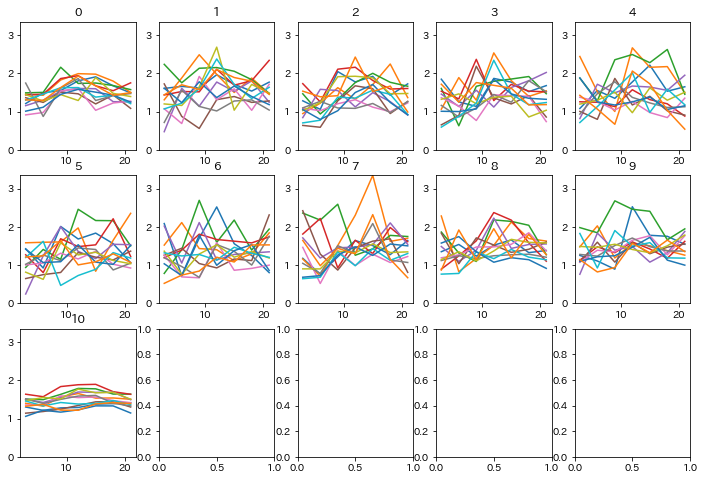

In [518]:
# 定義の曖昧さによるブレなのでは?
print("element:",element)

num_glaph = len(table["cloud"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

# 天気ごとの変化はグラフを複数用意
for num,cloud in enumerate(table["cloud"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["cloud"] == cloud)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
        ax[row,col].set_title(cloud)
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [519]:
# 月時天気雲量ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","weather","cloud"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: wind_speed


In [520]:
# 雲量が関係あるのでしょうか？
condition = (table["month"] == 5)
table.loc[condition,["month","hour","weather","cloud","count","std"]]

,month,hour,weather,cloud,count,std
473,5,3,1.0,0,100.0,1.155813
474,5,3,1.0,1,9.0,0.474342
475,5,3,2.0,2,20.0,0.842599
476,5,3,2.0,3,27.0,1.457205
477,5,3,2.0,4,16.0,0.817695
...,...,...,...,...,...,...
584,5,21,4.0,9,9.0,2.423210
585,5,21,4.0,10,174.0,1.550222
586,5,21,9.0,10,1.0,NaN
587,5,21,10.0,10,115.0,1.618239


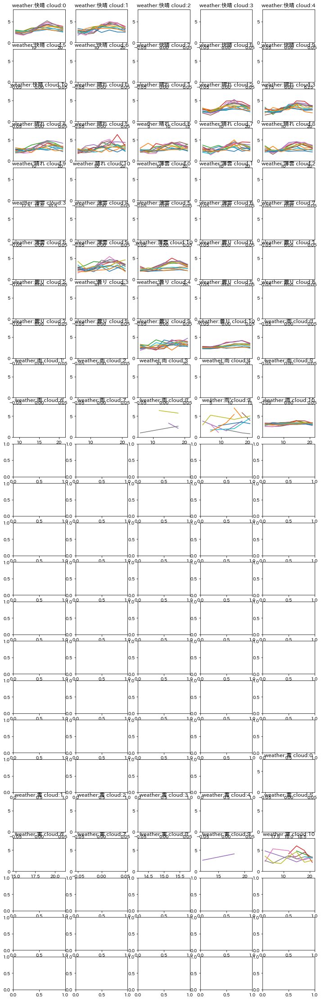

In [521]:
# 定義の曖昧さによるブレなのでは?

num_weather = len(table["weather"].unique())
num_cloud = len(table["cloud"].unique())
num_glaph = num_weather * num_cloud
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,40))

    
# 天気の変化と雲量の変化ごとにグラフを複数用意
for num_w,weather in enumerate(table["weather"].unique()):
    if weather in [8.0,9.0,11.0,12.0,13.0]:
        continue
    
    for num_c,cloud in enumerate(table["cloud"].unique()):
    
        num = num_w * num_cloud + num_c
        col = num%ncols
        row = int(num/ncols)

        # 月ごとの変化は同じグラフ内に
        for month in table["month"].unique():

            condition = (table["month"] == month) & (table["weather"] == weather) & (table["cloud"] == cloud)
            ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
            title = "weather:"+str(weather_sign[weather])+" cloud:"+str(cloud)
            ax[row,col].set_title(title)
            ax[row,col].set_ylim(ymin,ymax)

plt.show()

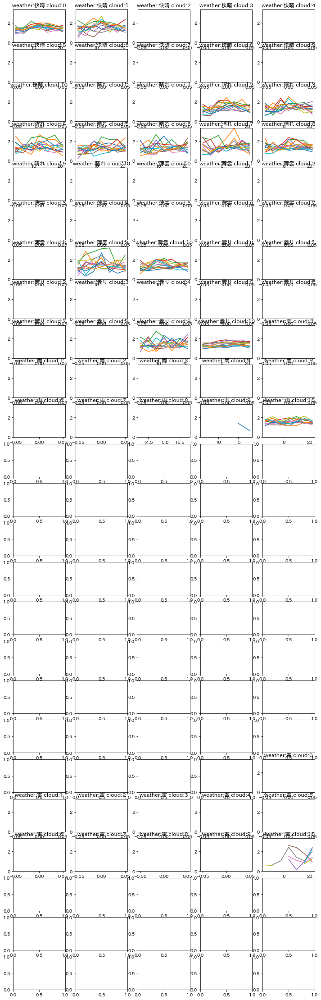

In [522]:
# 定義の曖昧さによるブレなのでは?

num_weather = len(table["weather"].unique())
num_cloud = len(table["cloud"].unique())
num_glaph = num_weather * num_cloud
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,40))

    
# 天気の変化と雲量の変化ごとにグラフを複数用意
for num_w,weather in enumerate(table["weather"].unique()):
    if weather in [8.0,9.0,11.0,12.0,13.0]:
        continue
    
    for num_c,cloud in enumerate(table["cloud"].unique()):
    
        num = num_w * num_cloud + num_c
        col = num%ncols
        row = int(num/ncols)

        # 月ごとの変化は同じグラフ内に
        for month in table["month"].unique():

            condition = (table["month"] == month) & (table["weather"] == weather) & (table["cloud"] == cloud)
            ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
            title = "weather:"+str(weather_sign[weather])+" cloud:"+str(cloud)
            ax[row,col].set_title(title)
            ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [329]:
# そこそこ欠損がある
condition = df_weather["wind_speed"].isnull()
df_weather.loc[condition][:50]

,year,month,day,hour,temperature,precipitation,sunshine,wind_speed,wind_direction,pressure,humidity,weather,cloud
860,2003,1,3,21,0.7,2.5,NaN,NaN,NaN,1010.2,86.0,10.0,10
861,2003,1,3,22,0.5,2.0,NaN,NaN,NaN,1006.9,87.0,NaN,NaN
862,2003,1,3,23,0.9,3.5,NaN,NaN,NaN,1004.8,88.0,NaN,NaN
863,2003,1,4,0,1.0,7.5,NaN,NaN,NaN,1002.7,89.0,NaN,NaN
864,2003,1,4,1,1.2,5.5,NaN,NaN,NaN,1001.7,89.0,NaN,NaN
865,2003,1,4,2,1.7,0.5,NaN,NaN,NaN,999.8,88.0,NaN,NaN
866,2003,1,4,3,1.8,0.0,NaN,NaN,NaN,999.4,89.0,4.0,10
27987,2006,2,7,4,0.5,1.5,NaN,NaN,NaN,1011.9,86.0,NaN,NaN
27988,2006,2,7,5,0.7,0.0,NaN,NaN,NaN,1010.1,85.0,NaN,NaN
27989,2006,2,7,6,0.5,0.0,NaN,NaN,NaN,1009.4,84.0,10.0,10


In [330]:
# どのようにして埋めますか？
df_weather["wind_speed"].isnull().sum()

66

In [ ]:
# 補完案：
# 同じ月日時の同じ天候で補完するとかが妥当か？

# Wind Direction：風向

単位：[]  
16方角で表記

TypeError: 'value' must be an instance of str or bytes, not a float

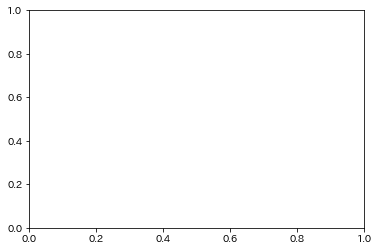

In [523]:
# ヒストグラム
# 基本はまあ振っとらんのですが
# 降水量70mmは何があったんや
element = "wind_direction"
plt.hist(df_weather[element],bins=50)
plt.show()

In [336]:
# 全体のブレ
print("element:",element)
df_weather[element].describe()

element: sunshine


count    153056.000000
mean          0.256149
std           0.398639
min           0.000000
25%           0.000000
50%           0.000000
75%           0.500000
max           1.000000
Name: sunshine, dtype: float64

In [337]:
# 年ごとのブレ
# 2008年から平均が落ちたのは集計の問題ですな
# 年を経るごとに傾向が変わっていることはなさそう？
print("element:",element)
df_weather.groupby("year", as_index=True).describe()[element].reset_index()

element: sunshine


,year,count,mean,std,min,25%,50%,75%,max
0,2002,363.0,0.401102,0.447089,0.0,0.0,0.1,1.0,1.0
1,2003,4784.0,0.360201,0.431598,0.0,0.0,0.0,0.9,1.0
2,2004,4796.0,0.444683,0.444129,0.0,0.0,0.3,1.0,1.0
3,2005,4784.0,0.410744,0.435472,0.0,0.0,0.2,1.0,1.0
4,2006,4784.0,0.331898,0.422405,0.0,0.0,0.0,0.8,1.0
5,2007,4784.0,0.417224,0.436922,0.0,0.0,0.2,1.0,1.0
6,2008,6896.0,0.269403,0.402077,0.0,0.0,0.0,0.6,1.0
7,2009,8760.0,0.203573,0.369826,0.0,0.0,0.0,0.2,1.0
8,2010,8756.0,0.226930,0.384866,0.0,0.0,0.0,0.3,1.0
9,2011,8760.0,0.234726,0.388521,0.0,0.0,0.0,0.4,1.0


In [338]:
# 月ごとのブレ
print("element:",element)
condition = df_weather["year"] > 2008
df_weather[condition].groupby(["month"], as_index=True).describe()[element].reset_index()

element: sunshine


,month,count,mean,std,min,25%,50%,75%,max
0,1,10416.0,0.268587,0.416169,0.0,0.0,0.0,0.6,1.0
1,2,9474.0,0.241545,0.401518,0.0,0.0,0.0,0.4,1.0
2,3,10415.0,0.245290,0.402124,0.0,0.0,0.0,0.5,1.0
3,4,10080.0,0.262153,0.408265,0.0,0.0,0.0,0.6,1.0
4,5,10403.0,0.265010,0.406348,0.0,0.0,0.0,0.6,1.0
5,6,10080.0,0.190665,0.351436,0.0,0.0,0.0,0.2,1.0
6,7,10402.0,0.211488,0.363030,0.0,0.0,0.0,0.3,1.0
7,8,10416.0,0.241820,0.377487,0.0,0.0,0.0,0.5,1.0
8,9,10075.0,0.182065,0.337855,0.0,0.0,0.0,0.2,1.0
9,10,10416.0,0.174914,0.344274,0.0,0.0,0.0,0.1,1.0


In [339]:
# 月ごとのブレ
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: sunshine


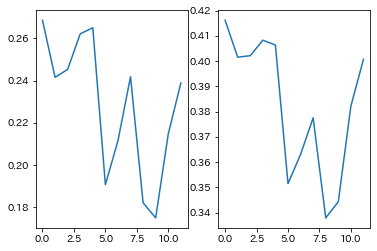

In [340]:
# 年内の降水量変化
# ８～９月が多いらしい　ブレ幅も大きいらしい　さす台風
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [341]:
# 月日ごとのブレ
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month","day"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: sunshine


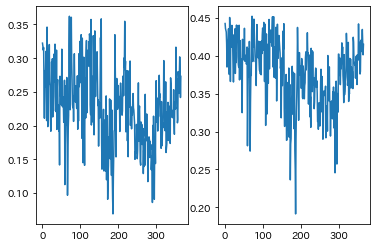

In [342]:
# やはり８～９月　梅雨の5～6月あたりも高めか　11～2月あたりは控え目
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [343]:
# 時ごとのブレ

print("element:",element)
df = df_weather[condition]
groupby_columns = ["hour"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)
table

element: sunshine


,hour,count,mean,std,min,25%,50%,75%,max
0,0,5081.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
1,1,5080.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
2,2,5080.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
3,3,5080.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
4,4,5078.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
5,5,5076.0,0.000256,0.005431,0.0,0.0,0.0,0.0,0.2
6,6,5073.0,0.075616,0.200224,0.0,0.0,0.0,0.0,1.0
7,7,5072.0,0.227898,0.365728,0.0,0.0,0.0,0.4,1.0
8,8,5073.0,0.416913,0.417964,0.0,0.0,0.3,0.9,1.0
9,9,5078.0,0.500354,0.449437,0.0,0.0,0.5,1.0,1.0


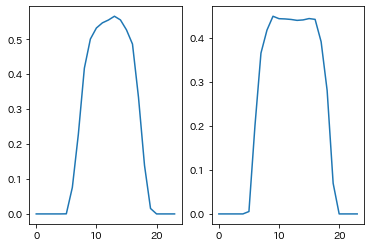

In [344]:
# 体感朝方と夕方に多いのか？日中と夜中は少ないのか？
# どうやら地域差が存在するらしい　東京の夏は夕立が起こりやすいとかなんとか
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [345]:
# 月時とごとのブレ
# 20~4までは0確定
# 日中ほどブレやすい
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month","hour"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)
table

element: sunshine


,month,hour,count,mean,std,min,25%,50%,75%,max
0,1,0,434.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,1,434.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1,2,434.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1,3,434.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1,4,434.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
283,12,19,403.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
284,12,20,403.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
285,12,21,403.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
286,12,22,403.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


element: sunshine


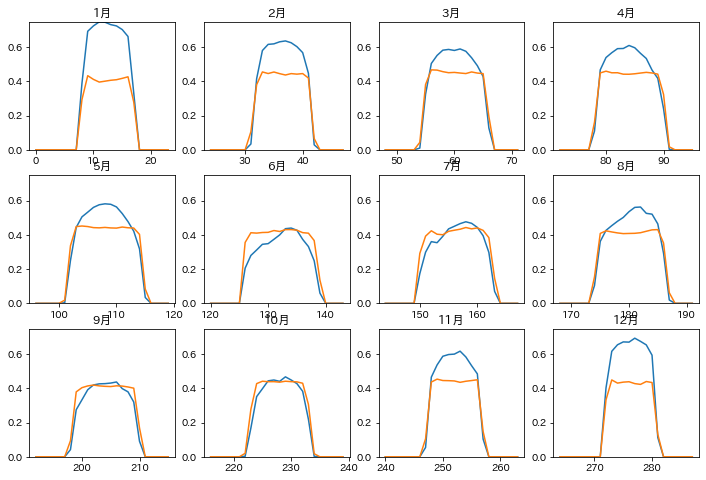

In [346]:
# 季節による差は大きそうですね
print("element:",element)
nrows = 3
ncols = 4
ymin = min(table["mean"].min(),table["std"].min())
ymax = max(table["mean"].max(),table["std"].max())

fig, axes = plt.subplots(nrows=nrows,ncols=ncols, figsize=(12,8))

for month in range(12):
    row = int(month/ncols)
    col = month%ncols
    condition = table["month"] == month+1
    axes[row,col].plot(table.loc[condition,"mean"])
    axes[row,col].plot(table.loc[condition,"std"])
    axes[row,col].set_title(str(month+1)+"月")
    axes[row,col].set_ylim(ymin,ymax)

plt.show()

element: sunshine


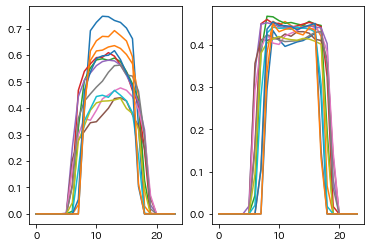

In [347]:
# だいぶぐちゃぐちゃでございますね…
print("element:",element)
fig, ax = plt.subplots(nrows=1,ncols=2)
for month in range(12):
    condition = table["month"] == month+1
    ax[0].plot(table.loc[condition,"mean"].reset_index(drop=True))
    ax[1].plot(table.loc[condition,"std"].reset_index(drop=True))

plt.show()

In [348]:
# 天気がある時間
condition = df_weather["hour"].isin([3,6,9,12,15,18,21])
exist_weather = copy(df_weather[condition])

In [349]:
# 天気ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["weather"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: sunshine


In [350]:
# 対応表
weather_sign = {
    1.0: "快晴",
    2.0: "晴れ",
    3.0: "薄雲",
    4.0: "曇り",
    8.0: "霧",
    9.0: "霧雨",
    10.0: "雨",
    11.0: "みぞれ",
    12.0: "雪",
    13.0: "あられ",
    15.0: "雷",
}

In [351]:
# 月時天気ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","weather"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: sunshine


In [352]:
# 雲量が関係あるのでしょうか？
print("element:",element)
condition = (table["month"] == 5)
table.loc[condition,["month","hour","weather","count","std"]]

element: sunshine


,month,hour,weather,count,std
223,5,9,1.0,98.0,0.014212
224,5,9,2.0,131.0,0.227316
225,5,9,3.0,99.0,0.298536
226,5,9,4.0,200.0,0.204718
227,5,9,9.0,6.0,0.000000
228,5,9,10.0,85.0,0.018562
229,5,12,1.0,99.0,0.000000
230,5,12,2.0,132.0,0.175815
231,5,12,3.0,128.0,0.290969
232,5,12,4.0,169.0,0.230009


element: sunshine


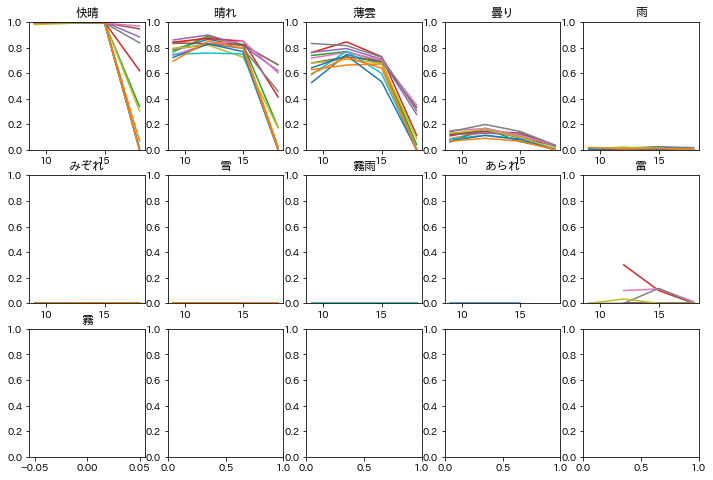

In [353]:
# 定義上、晴れや曇りでは雨降ってないからね。仕方ないね
print("element:",element)

num_glaph = len(table["weather"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,weather in enumerate(table["weather"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["weather"] == weather)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
        ax[row,col].set_title(weather_sign[weather])
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

element: sunshine


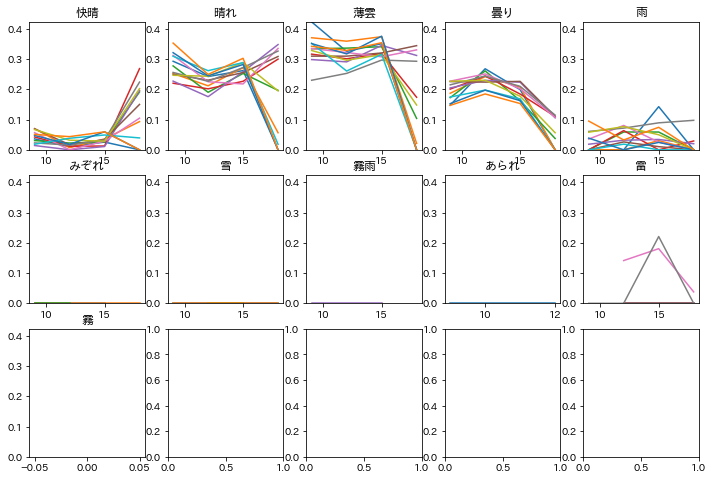

In [354]:
# 定義の曖昧さによるブレなのでは
print("element:",element)

num_glaph = len(table["weather"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,weather in enumerate(table["weather"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["weather"] == weather)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
        ax[row,col].set_title(weather_sign[weather])
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [355]:
# 雲量を0+ → 0, 10- → 10 に変換
df_weather_cloud = copy(df_weather)
search = "([0-9]+)(\+|\-)"
condition_isnull = ~(df_weather["cloud"].isnull())
condition_cloud = df_weather.loc[condition_isnull,"cloud"].map(lambda x: search_object(search,x))
weather_cloud = copy(df_weather[condition_isnull])
weather_cloud.loc[condition_cloud,"cloud"] = \
weather_cloud.loc[condition_cloud,"cloud"].map(lambda x: re.search(search,x).group(1))
df_weather_cloud.loc[condition_isnull,"cloud"] = weather_cloud["cloud"].astype(int)

In [356]:
# 天気がある時間
condition = df_weather_cloud["hour"].isin([3,6,9,12,15,18,21])
exist_weather = copy(df_weather_cloud[condition])

In [357]:
# 月時雲量ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","cloud"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: sunshine


In [358]:
# 雲量が関係あるのでしょうか？
print("element:",element)
condition = (table["month"] == 5)
table.loc[condition,["month","hour","cloud","count","std"]]

element: sunshine


,month,hour,cloud,count,std
330,5,9,0,76.0,0.016114
331,5,9,1,22.0,0.000000
332,5,9,2,16.0,0.178769
333,5,9,3,21.0,0.095618
334,5,9,4,15.0,0.183095
335,5,9,5,11.0,0.304213
336,5,9,6,19.0,0.201311
337,5,9,7,16.0,0.189627
338,5,9,8,33.0,0.281769
339,5,9,9,30.0,0.344564


element: sunshine


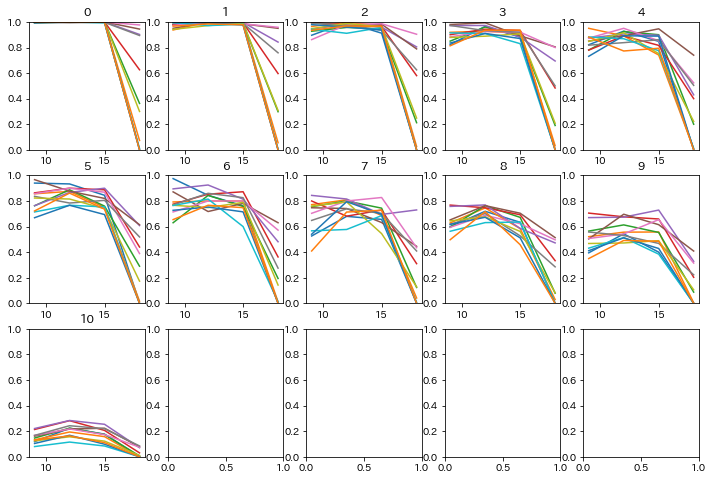

In [359]:
# 定義の曖昧さによるブレなのでは?
print("element:",element)

num_glaph = len(table["cloud"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,cloud in enumerate(table["cloud"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["cloud"] == cloud)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
        ax[row,col].set_title(cloud)
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

element: sunshine


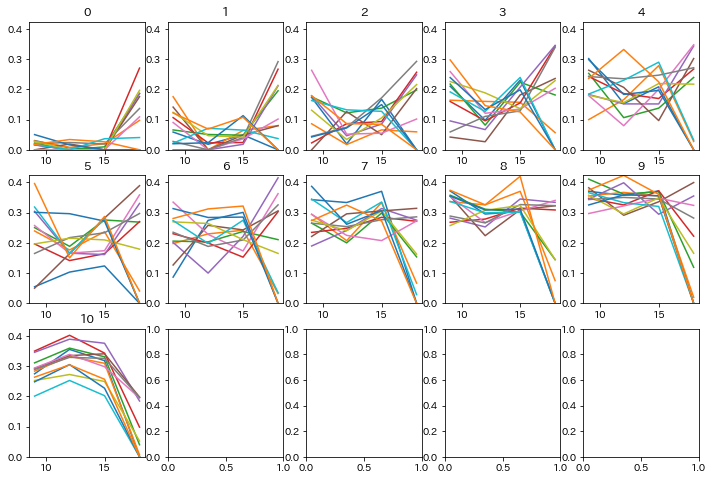

In [360]:
# 定義の曖昧さによるブレなのでは?
print("element:",element)

num_glaph = len(table["cloud"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

# 天気ごとの変化はグラフを複数用意
for num,cloud in enumerate(table["cloud"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["cloud"] == cloud)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
        ax[row,col].set_title(cloud)
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [361]:
# 月時天気雲量ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","weather","cloud"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: sunshine


In [362]:
# 雲量が関係あるのでしょうか？
condition = (table["month"] == 5)
table.loc[condition,["month","hour","weather","cloud","count","std"]]

,month,hour,weather,cloud,count,std
505,5,9,1.0,0,76.0,0.016114
506,5,9,1.0,1,22.0,0.000000
507,5,9,2.0,2,16.0,0.178769
508,5,9,2.0,3,21.0,0.095618
509,5,9,2.0,4,15.0,0.183095
...,...,...,...,...,...,...
568,5,18,10.0,8,1.0,NaN
569,5,18,10.0,9,2.0,0.000000
570,5,18,10.0,10,95.0,0.000000
571,5,18,15.0,9,1.0,NaN


In [ ]:
# 定義の曖昧さによるブレなのでは?

num_weather = len(table["weather"].unique())
num_cloud = len(table["cloud"].unique())
num_glaph = num_weather * num_cloud
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,40))

    
# 天気の変化と雲量の変化ごとにグラフを複数用意
for num_w,weather in enumerate(table["weather"].unique()):
    if weather in [8.0,9.0,11.0,12.0,13.0]:
        continue
    
    for num_c,cloud in enumerate(table["cloud"].unique()):
    
        num = num_w * num_cloud + num_c
        col = num%ncols
        row = int(num/ncols)

        # 月ごとの変化は同じグラフ内に
        for month in table["month"].unique():

            condition = (table["month"] == month) & (table["weather"] == weather) & (table["cloud"] == cloud)
            ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
            title = "weather:"+str(weather_sign[weather])+" cloud:"+str(cloud)
            ax[row,col].set_title(title)
            ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [ ]:
# 定義の曖昧さによるブレなのでは?

num_weather = len(table["weather"].unique())
num_cloud = len(table["cloud"].unique())
num_glaph = num_weather * num_cloud
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,40))

    
# 天気の変化と雲量の変化ごとにグラフを複数用意
for num_w,weather in enumerate(table["weather"].unique()):
    if weather in [8.0,9.0,11.0,12.0,13.0]:
        continue
    
    for num_c,cloud in enumerate(table["cloud"].unique()):
    
        num = num_w * num_cloud + num_c
        col = num%ncols
        row = int(num/ncols)

        # 月ごとの変化は同じグラフ内に
        for month in table["month"].unique():

            condition = (table["month"] == month) & (table["weather"] == weather) & (table["cloud"] == cloud)
            ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
            title = "weather:"+str(weather_sign[weather])+" cloud:"+str(cloud)
            ax[row,col].set_title(title)
            ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [ ]:
# 欠損については風向と同じ

# Pressure：気圧

単位：[hPa]

In [135]:
element = "pressure"

element: pressure


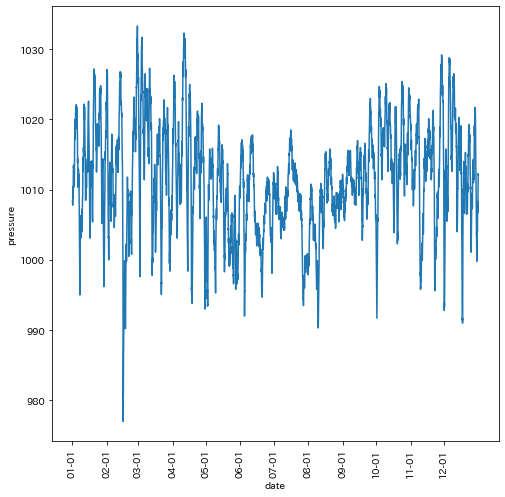

In [136]:
# 折れ線グラフ(2021)
print("element:",element)
condition = df_weather["year"] == 2021
xticks = [ datetime for datetime in df_weather.loc[condition,"datetime"] if "01 00:00:00" in datetime ]
labels = [ datetime[5:10] for datetime in df_weather.loc[condition,"datetime"] if "01 00:00:00" in datetime ]
plt.figure(figsize=(8,8))
plt.plot(df_weather.loc[condition,"datetime"],df_weather.loc[condition,element])
plt.xticks(xticks,labels,rotation=90)
plt.xlabel("date")
plt.ylabel(element)
plt.show()

element: pressure


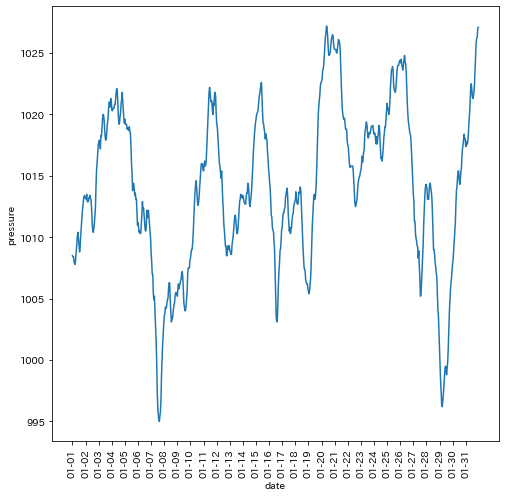

In [137]:
# 折れ線グラフ(2021年1月)
print("element:",element)
condition = (df_weather["year"] == 2021) & (df_weather["month"] == 1)
xticks = [ datetime for datetime in df_weather.loc[condition,"datetime"] if "00:00:00" in datetime ]
labels = [ datetime[5:10] for datetime in df_weather.loc[condition,"datetime"] if "00:00:00" in datetime ]
plt.figure(figsize=(8,8))
plt.plot(df_weather.loc[condition,"datetime"],df_weather.loc[condition,element])
plt.xticks(xticks,labels,rotation=90)
plt.xlabel("date")
plt.ylabel(element)
plt.show()

element: pressure


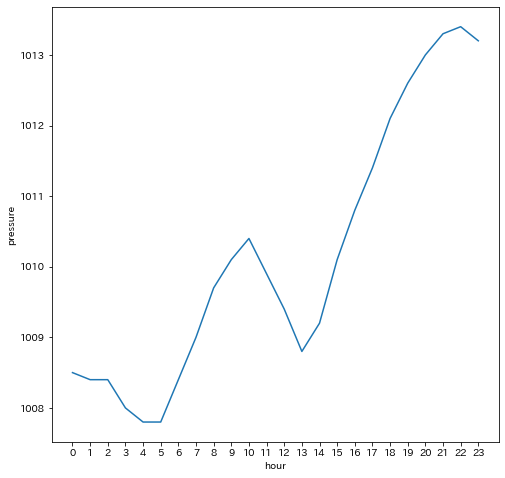

In [138]:
# 折れ線グラフ(2021年1月1日)
print("element:",element)
condition = (df_weather["year"] == 2021) & (df_weather["month"] == 1)& (df_weather["day"] == 1)
plt.figure(figsize=(8,8))
plt.plot(df_weather.loc[condition,"datetime"],df_weather.loc[condition,element])
plt.xticks(df_weather.loc[condition,"datetime"],[i for i in range(24)])
plt.xlabel("hour")
plt.ylabel(element)
plt.show()

element: pressure


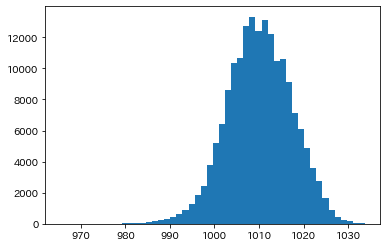

In [163]:
# ヒストグラム
# 基本はまあ振っとらんのですが
# 降水量70mmは何があったんや
print("element:",element)
plt.hist(df_weather[element],bins=50)
plt.show()

In [225]:
# 全体のブレ
print("element:",element)
df_weather[element].describe()

element: humidity


count    175269.000000
mean         63.676132
std          19.863302
min           8.000000
25%          49.000000
50%          65.000000
75%          79.000000
max         100.000000
Name: humidity, dtype: float64

In [226]:
# 年ごとのブレ
# 2008年から平均が落ちたのは集計の問題ですな
# 年を経るごとに傾向が変わっていることはなさそう？
print("element:",element)
df_weather.groupby("year", as_index=True).describe()[element].reset_index()

element: humidity


,year,count,mean,std,min,25%,50%,75%,max
0,2002,791.0,56.426043,16.412230,16.0,44.0,56.0,67.0,90.0
1,2003,8759.0,60.927731,18.522741,8.0,47.0,63.0,76.0,93.0
2,2004,8784.0,58.126594,18.000364,11.0,45.0,59.0,72.0,92.0
3,2005,8760.0,57.460731,18.859848,11.0,43.0,59.0,73.0,91.0
4,2006,8760.0,60.572374,18.271281,12.0,48.0,63.0,75.0,91.0
5,2007,8760.0,58.361986,17.654067,11.0,45.0,60.0,72.0,92.0
6,2008,8783.0,60.341455,18.830535,9.0,46.0,62.0,76.0,93.0
7,2009,8760.0,59.795434,18.059768,12.0,47.0,62.0,74.0,92.0
8,2010,8760.0,60.780251,16.626725,11.0,49.0,62.0,74.0,91.0
9,2011,8760.0,57.610388,18.234569,11.0,44.0,59.0,72.0,91.0


In [227]:
# 月ごとのブレ
print("element:",element)
condition = df_weather["year"] > 2008
df_weather[condition].groupby(["month"], as_index=True).describe()[element].reset_index()

element: humidity


,month,count,mean,std,min,25%,50%,75%,max
0,1,10407.0,49.897665,18.922752,11.0,36.0,46.0,61.0,100.0
1,2,9480.0,53.131224,20.103039,12.0,37.0,50.0,67.0,100.0
2,3,10405.0,58.121961,21.473028,11.0,41.0,57.0,75.0,100.0
3,4,10080.0,62.362103,21.050114,10.0,46.0,62.0,79.0,100.0
4,5,10410.0,66.645149,19.289780,14.0,53.0,68.0,82.0,100.0
5,6,10067.0,75.067249,15.610319,18.0,65.0,76.0,87.0,100.0
6,7,10416.0,77.714382,13.392417,36.0,68.0,78.0,87.0,100.0
7,8,10416.0,75.124136,13.024791,30.0,66.0,75.0,85.0,100.0
8,9,10080.0,75.973413,15.595266,22.0,65.0,76.0,88.0,100.0
9,10,10413.0,71.191683,17.623200,23.0,59.0,72.0,85.0,100.0


In [228]:
# 月ごとのブレ
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: humidity


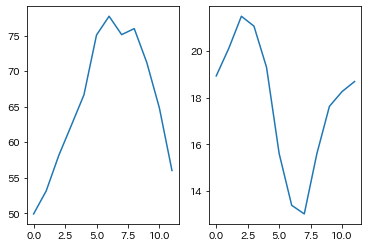

In [229]:
# 年内の降水量変化
# ８～９月が多いらしい　ブレ幅も大きいらしい　さす台風
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [230]:
# 月日ごとのブレ
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month","day"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: humidity


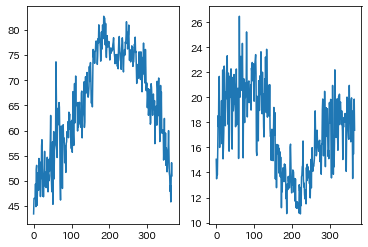

In [231]:
# やはり８～９月　梅雨の5～6月あたりも高めか　11～2月あたりは控え目
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [232]:
# 時ごとのブレ

print("element:",element)
df = df_weather[condition]
groupby_columns = ["hour"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)
table

element: humidity


,hour,count,mean,std,min,25%,50%,75%,max
0,0,5079.0,71.650522,18.427031,14.0,59.0,75.0,85.00,100.0
1,1,5078.0,72.319811,18.390607,15.0,59.0,75.0,86.00,100.0
2,2,5077.0,72.823715,18.348378,17.0,60.0,76.0,87.00,100.0
3,3,5076.0,73.245863,18.330126,21.0,60.0,77.0,87.25,100.0
4,4,5075.0,73.587783,18.264792,18.0,60.0,77.0,88.00,100.0
5,5,5075.0,73.819310,18.267994,16.0,61.0,77.0,88.00,100.0
6,6,5074.0,73.345093,17.998964,21.0,60.0,76.0,87.00,100.0
7,7,5075.0,71.143448,17.701348,19.0,58.5,73.0,84.00,100.0
8,8,5076.0,67.510638,17.885979,19.0,55.0,68.0,80.00,100.0
9,9,5080.0,63.490157,18.687867,16.0,50.0,64.0,76.00,100.0


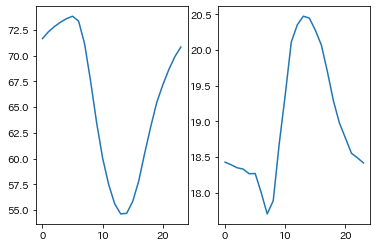

In [233]:
# 体感朝方と夕方に多いのか？日中と夜中は少ないのか？
# どうやら地域差が存在するらしい　東京の夏は夕立が起こりやすいとかなんとか
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [234]:
# 月時とごとのブレ
# 20~4までは0確定
# 日中ほどブレやすい
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month","hour"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)
table

element: humidity


,month,hour,count,mean,std,min,25%,50%,75%,max
0,1,0,434.0,55.633641,17.861072,23.0,42.0,52.0,66.75,100.0
1,1,1,434.0,55.937788,17.776994,22.0,42.0,52.0,67.00,100.0
2,1,2,434.0,55.661290,17.356286,23.0,42.0,52.0,67.00,100.0
3,1,3,433.0,56.066975,17.096070,25.0,42.0,53.0,67.00,100.0
4,1,4,433.0,56.360277,16.982275,26.0,43.0,54.0,67.00,100.0
...,...,...,...,...,...,...,...,...,...,...
283,12,19,403.0,54.928040,18.436182,21.0,40.0,52.0,66.50,100.0
284,12,20,403.0,56.503722,17.992864,21.0,42.0,53.0,69.00,100.0
285,12,21,403.0,57.779156,18.019154,24.0,44.0,55.0,71.00,100.0
286,12,22,403.0,58.900744,17.914948,25.0,45.0,55.0,71.00,100.0


element: humidity


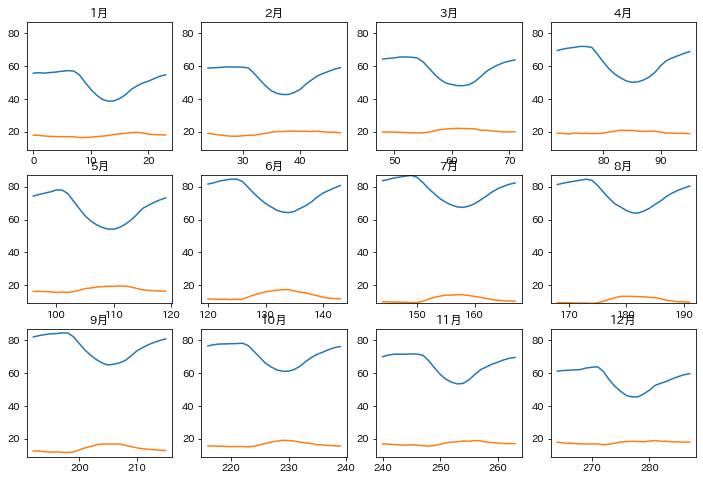

In [235]:
# 季節による差は大きそうですね
print("element:",element)
nrows = 3
ncols = 4
ymin = min(table["mean"].min(),table["std"].min())
ymax = max(table["mean"].max(),table["std"].max())

fig, axes = plt.subplots(nrows=nrows,ncols=ncols, figsize=(12,8))

for month in range(12):
    row = int(month/ncols)
    col = month%ncols
    condition = table["month"] == month+1
    axes[row,col].plot(table.loc[condition,"mean"])
    axes[row,col].plot(table.loc[condition,"std"])
    axes[row,col].set_title(str(month+1)+"月")
    axes[row,col].set_ylim(ymin,ymax)

plt.show()

element: humidity


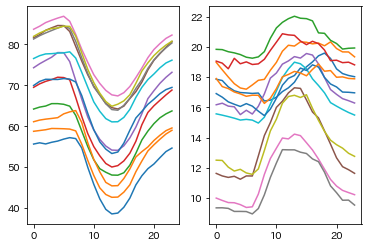

In [236]:
# だいぶぐちゃぐちゃでございますね…
print("element:",element)
fig, ax = plt.subplots(nrows=1,ncols=2)
for month in range(12):
    condition = table["month"] == month+1
    ax[0].plot(table.loc[condition,"mean"].reset_index(drop=True))
    ax[1].plot(table.loc[condition,"std"].reset_index(drop=True))

plt.show()

In [237]:
# 天気がある時間
condition = df_weather["hour"].isin([3,6,9,12,15,18,21])
exist_weather = copy(df_weather[condition])

In [238]:
# 天気ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["weather"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: humidity


In [239]:
# 対応表
weather_sign = {
    1.0: "快晴",
    2.0: "晴れ",
    3.0: "薄雲",
    4.0: "曇り",
    8.0: "霧",
    9.0: "霧雨",
    10.0: "雨",
    11.0: "みぞれ",
    12.0: "雪",
    13.0: "あられ",
    15.0: "雷",
}

In [240]:
# 月時天気ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","weather"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: humidity


In [241]:
# 雲量が関係あるのでしょうか？
print("element:",element)
condition = (table["month"] == 5)
table.loc[condition,["month","hour","weather","count","std"]]

element: humidity


,month,hour,weather,count,std
210,5,3,1.0,109.0,18.548185
211,5,3,2.0,121.0,16.846638
212,5,3,3.0,77.0,12.674092
213,5,3,4.0,219.0,13.691223
214,5,3,9.0,4.0,3.593976
215,5,3,10.0,88.0,8.651615
216,5,3,15.0,1.0,NaN
217,5,6,1.0,99.0,17.384789
218,5,6,2.0,110.0,14.661396
219,5,6,3.0,94.0,13.670369


element: humidity


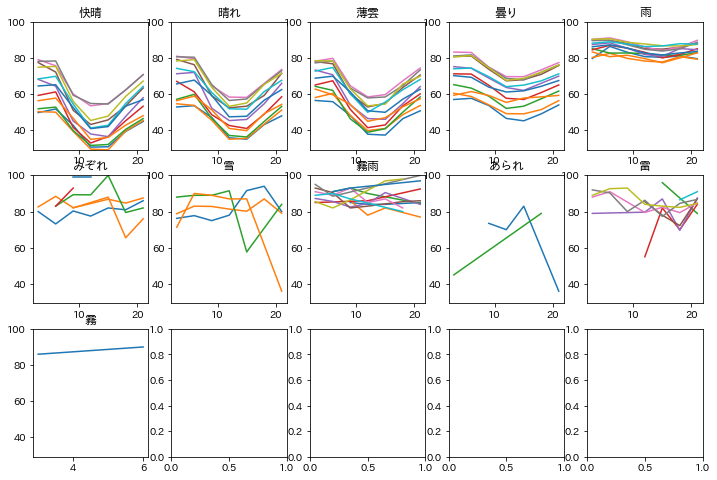

In [242]:
# 定義上、晴れや曇りでは雨降ってないからね。仕方ないね
print("element:",element)

num_glaph = len(table["weather"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,weather in enumerate(table["weather"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["weather"] == weather)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
        ax[row,col].set_title(weather_sign[weather])
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

element: humidity


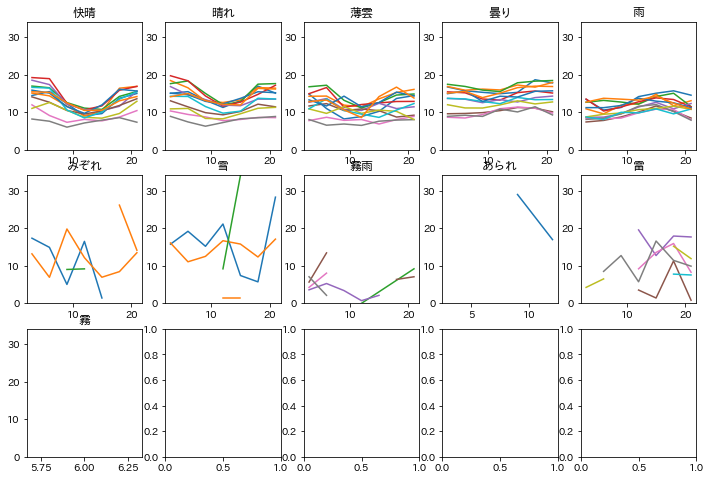

In [243]:
# 定義の曖昧さによるブレなのでは
print("element:",element)

num_glaph = len(table["weather"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,weather in enumerate(table["weather"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["weather"] == weather)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
        ax[row,col].set_title(weather_sign[weather])
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [244]:
# 雲量を0+ → 0, 10- → 10 に変換
df_weather_cloud = copy(df_weather)
search = "([0-9]+)(\+|\-)"
condition_isnull = ~(df_weather["cloud"].isnull())
condition_cloud = df_weather.loc[condition_isnull,"cloud"].map(lambda x: search_object(search,x))
weather_cloud = copy(df_weather[condition_isnull])
weather_cloud.loc[condition_cloud,"cloud"] = \
weather_cloud.loc[condition_cloud,"cloud"].map(lambda x: re.search(search,x).group(1))
df_weather_cloud.loc[condition_isnull,"cloud"] = weather_cloud["cloud"].astype(int)

In [245]:
# 天気がある時間
condition = df_weather_cloud["hour"].isin([3,6,9,12,15,18,21])
exist_weather = copy(df_weather_cloud[condition])

In [246]:
# 月時雲量ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","cloud"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: humidity


In [247]:
# 雲量が関係あるのでしょうか？
print("element:",element)
condition = (table["month"] == 5)
table.loc[condition,["month","hour","cloud","count","std"]]

element: humidity


,month,hour,cloud,count,std
308,5,3,0,100.0,18.468808
309,5,3,1,9.0,16.224981
310,5,3,2,20.0,15.635991
311,5,3,3,27.0,17.059808
312,5,3,4,16.0,20.019990
...,...,...,...,...,...
380,5,21,6,12.0,16.637626
381,5,21,7,22.0,13.329653
382,5,21,8,24.0,10.946428
383,5,21,9,21.0,7.344904


element: humidity


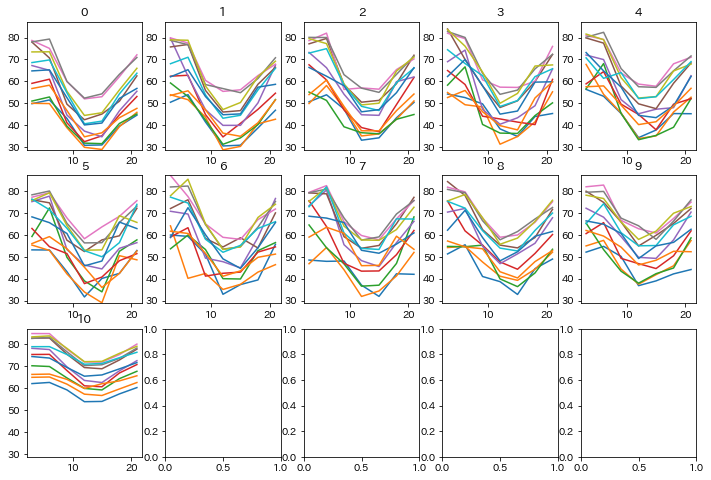

In [248]:
# 定義の曖昧さによるブレなのでは?
print("element:",element)

num_glaph = len(table["cloud"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,cloud in enumerate(table["cloud"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["cloud"] == cloud)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
        ax[row,col].set_title(cloud)
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

element: humidity


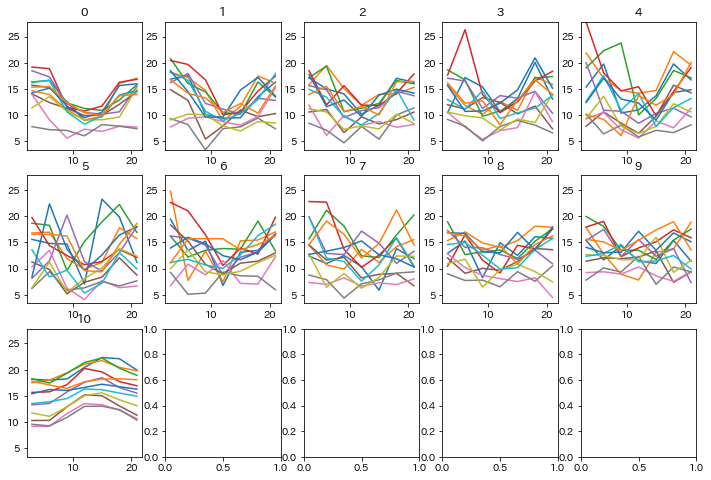

In [249]:
# 定義の曖昧さによるブレなのでは?
print("element:",element)

num_glaph = len(table["cloud"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

# 天気ごとの変化はグラフを複数用意
for num,cloud in enumerate(table["cloud"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["cloud"] == cloud)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
        ax[row,col].set_title(cloud)
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [250]:
# 月時天気雲量ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","weather","cloud"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: humidity


In [251]:
# 雲量が関係あるのでしょうか？
condition = (table["month"] == 5)
table.loc[condition,["month","hour","weather","cloud","count","std"]]

,month,hour,weather,cloud,count,std
473,5,3,1.0,0,100.0,18.468808
474,5,3,1.0,1,9.0,16.224981
475,5,3,2.0,2,20.0,15.635991
476,5,3,2.0,3,27.0,17.059808
477,5,3,2.0,4,16.0,20.019990
...,...,...,...,...,...,...
584,5,21,4.0,9,9.0,8.110350
585,5,21,4.0,10,174.0,14.565717
586,5,21,9.0,10,1.0,NaN
587,5,21,10.0,10,115.0,12.341054


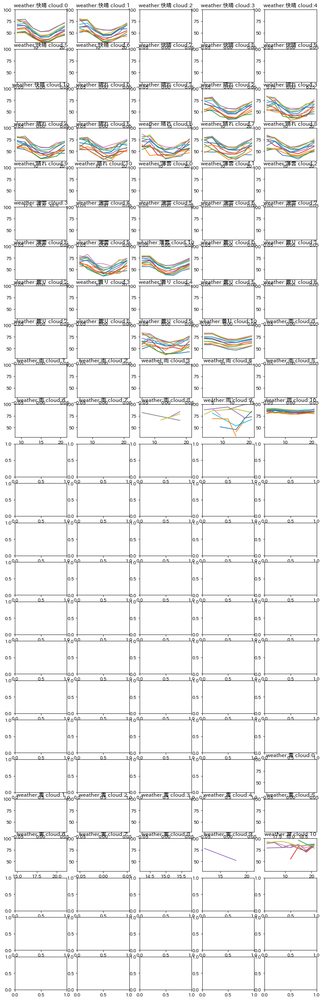

In [252]:
# 定義の曖昧さによるブレなのでは?

num_weather = len(table["weather"].unique())
num_cloud = len(table["cloud"].unique())
num_glaph = num_weather * num_cloud
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,40))

    
# 天気の変化と雲量の変化ごとにグラフを複数用意
for num_w,weather in enumerate(table["weather"].unique()):
    if weather in [8.0,9.0,11.0,12.0,13.0]:
        continue
    
    for num_c,cloud in enumerate(table["cloud"].unique()):
    
        num = num_w * num_cloud + num_c
        col = num%ncols
        row = int(num/ncols)

        # 月ごとの変化は同じグラフ内に
        for month in table["month"].unique():

            condition = (table["month"] == month) & (table["weather"] == weather) & (table["cloud"] == cloud)
            ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
            title = "weather:"+str(weather_sign[weather])+" cloud:"+str(cloud)
            ax[row,col].set_title(title)
            ax[row,col].set_ylim(ymin,ymax)

plt.show()

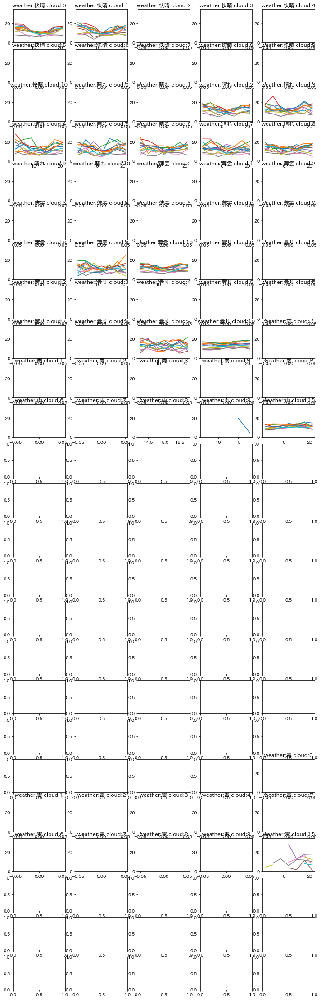

In [253]:
# 定義の曖昧さによるブレなのでは?

num_weather = len(table["weather"].unique())
num_cloud = len(table["cloud"].unique())
num_glaph = num_weather * num_cloud
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,40))

    
# 天気の変化と雲量の変化ごとにグラフを複数用意
for num_w,weather in enumerate(table["weather"].unique()):
    if weather in [8.0,9.0,11.0,12.0,13.0]:
        continue
    
    for num_c,cloud in enumerate(table["cloud"].unique()):
    
        num = num_w * num_cloud + num_c
        col = num%ncols
        row = int(num/ncols)

        # 月ごとの変化は同じグラフ内に
        for month in table["month"].unique():

            condition = (table["month"] == month) & (table["weather"] == weather) & (table["cloud"] == cloud)
            ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
            title = "weather:"+str(weather_sign[weather])+" cloud:"+str(cloud)
            ax[row,col].set_title(title)
            ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [254]:
# 欠損の皆さん
condition = df_weather['pressure'].isnull()
df_weather[condition]

,datetime,year,month,day,hour,temperature,precipitation,sunshine,wind_speed,wind_direction,pressure,humidity,weather,cloud
51841,2008-10-28 02:00:00,2008,10,28,2,14.2,0.0,0.0,2.5,北西,NaN,73.0,NaN,NaN
149124,2019-12-03 13:00:00,2019,12,3,13,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
149125,2019-12-03 14:00:00,2019,12,3,14,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
149265,2019-12-09 10:00:00,2019,12,9,10,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [255]:
# 補完方法？
df_weather["pressure"].isnull().sum()

4

In [338]:
# 周辺から滑らかにつなげば？

# Humidity：湿度

単位：[%]

In [256]:
element = "humidity"

element: humidity


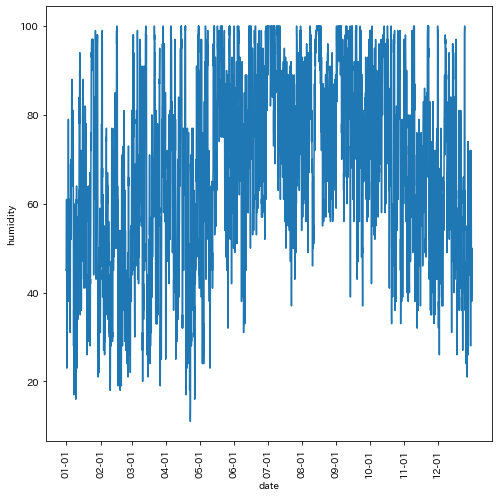

In [257]:
# 折れ線グラフ(2021)
print("element:",element)
condition = df_weather["year"] == 2021
xticks = [ datetime for datetime in df_weather.loc[condition,"datetime"] if "01 00:00:00" in datetime ]
labels = [ datetime[5:10] for datetime in df_weather.loc[condition,"datetime"] if "01 00:00:00" in datetime ]
plt.figure(figsize=(8,8))
plt.plot(df_weather.loc[condition,"datetime"],df_weather.loc[condition,element])
plt.xticks(xticks,labels,rotation=90)
plt.xlabel("date")
plt.ylabel(element)
plt.show()

element: humidity


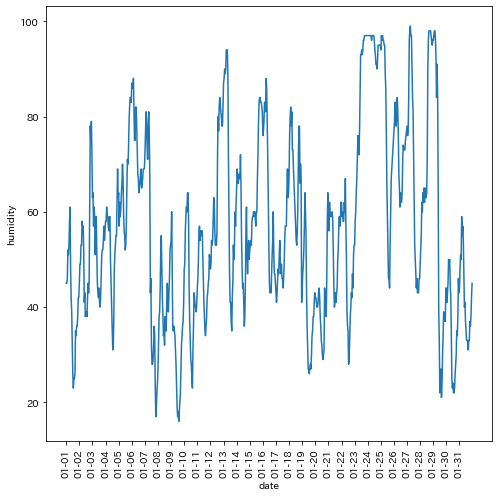

In [258]:
# 折れ線グラフ(2021年1月)
print("element:",element)
condition = (df_weather["year"] == 2021) & (df_weather["month"] == 1)
xticks = [ datetime for datetime in df_weather.loc[condition,"datetime"] if "00:00:00" in datetime ]
labels = [ datetime[5:10] for datetime in df_weather.loc[condition,"datetime"] if "00:00:00" in datetime ]
plt.figure(figsize=(8,8))
plt.plot(df_weather.loc[condition,"datetime"],df_weather.loc[condition,element])
plt.xticks(xticks,labels,rotation=90)
plt.xlabel("date")
plt.ylabel(element)
plt.show()

element: humidity


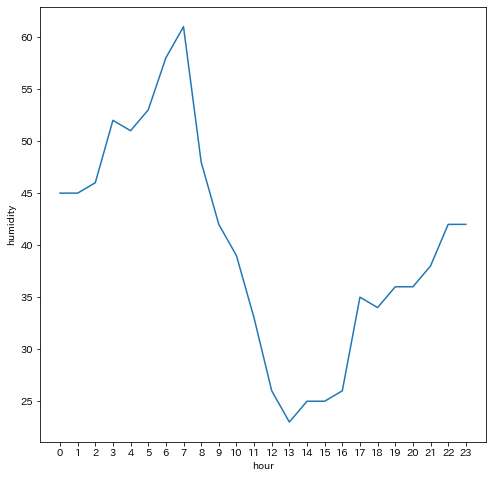

In [259]:
# 折れ線グラフ(2021年1月1日)
print("element:",element)
condition = (df_weather["year"] == 2021) & (df_weather["month"] == 1)& (df_weather["day"] == 1)
plt.figure(figsize=(8,8))
plt.plot(df_weather.loc[condition,"datetime"],df_weather.loc[condition,element])
plt.xticks(df_weather.loc[condition,"datetime"],[i for i in range(24)])
plt.xlabel("hour")
plt.ylabel(element)
plt.show()

element: humidity


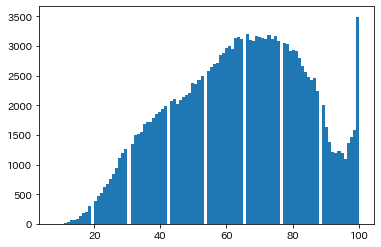

In [260]:
# ヒストグラム
# 基本はまあ振っとらんのですが
# 降水量70mmは何があったんや
print("element:",element)
plt.hist(df_weather[element],bins=100)
plt.show()

In [261]:
# 全体のブレ
print("element:",element)
df_weather[element].describe()

element: humidity


count    175269.000000
mean         63.676132
std          19.863302
min           8.000000
25%          49.000000
50%          65.000000
75%          79.000000
max         100.000000
Name: humidity, dtype: float64

In [262]:
# 年ごとのブレ
# 2008年から平均が落ちたのは集計の問題ですな
# 年を経るごとに傾向が変わっていることはなさそう？
print("element:",element)
df_weather.groupby("year", as_index=True).describe()[element].reset_index()

element: humidity


,year,count,mean,std,min,25%,50%,75%,max
0,2002,791.0,56.426043,16.412230,16.0,44.0,56.0,67.0,90.0
1,2003,8759.0,60.927731,18.522741,8.0,47.0,63.0,76.0,93.0
2,2004,8784.0,58.126594,18.000364,11.0,45.0,59.0,72.0,92.0
3,2005,8760.0,57.460731,18.859848,11.0,43.0,59.0,73.0,91.0
4,2006,8760.0,60.572374,18.271281,12.0,48.0,63.0,75.0,91.0
5,2007,8760.0,58.361986,17.654067,11.0,45.0,60.0,72.0,92.0
6,2008,8783.0,60.341455,18.830535,9.0,46.0,62.0,76.0,93.0
7,2009,8760.0,59.795434,18.059768,12.0,47.0,62.0,74.0,92.0
8,2010,8760.0,60.780251,16.626725,11.0,49.0,62.0,74.0,91.0
9,2011,8760.0,57.610388,18.234569,11.0,44.0,59.0,72.0,91.0


In [263]:
# 月ごとのブレ
print("element:",element)
condition = df_weather["year"] > 2008
df_weather[condition].groupby(["month"], as_index=True).describe()[element].reset_index()

element: humidity


,month,count,mean,std,min,25%,50%,75%,max
0,1,10407.0,49.897665,18.922752,11.0,36.0,46.0,61.0,100.0
1,2,9480.0,53.131224,20.103039,12.0,37.0,50.0,67.0,100.0
2,3,10405.0,58.121961,21.473028,11.0,41.0,57.0,75.0,100.0
3,4,10080.0,62.362103,21.050114,10.0,46.0,62.0,79.0,100.0
4,5,10410.0,66.645149,19.289780,14.0,53.0,68.0,82.0,100.0
5,6,10067.0,75.067249,15.610319,18.0,65.0,76.0,87.0,100.0
6,7,10416.0,77.714382,13.392417,36.0,68.0,78.0,87.0,100.0
7,8,10416.0,75.124136,13.024791,30.0,66.0,75.0,85.0,100.0
8,9,10080.0,75.973413,15.595266,22.0,65.0,76.0,88.0,100.0
9,10,10413.0,71.191683,17.623200,23.0,59.0,72.0,85.0,100.0


In [264]:
# 月ごとのブレ
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: humidity


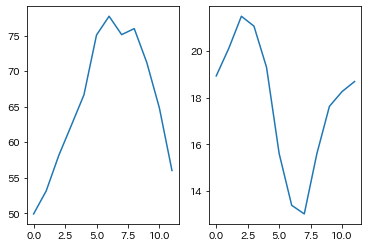

In [265]:
# 年内の降水量変化
# ８～９月が多いらしい　ブレ幅も大きいらしい　さす台風
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [266]:
# 月日ごとのブレ
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month","day"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: humidity


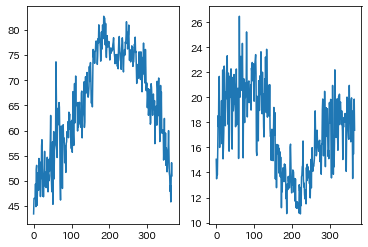

In [267]:
# やはり８～９月　梅雨の5～6月あたりも高めか　11～2月あたりは控え目
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [268]:
# 時ごとのブレ

print("element:",element)
df = df_weather[condition]
groupby_columns = ["hour"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)
table

element: humidity


,hour,count,mean,std,min,25%,50%,75%,max
0,0,5079.0,71.650522,18.427031,14.0,59.0,75.0,85.00,100.0
1,1,5078.0,72.319811,18.390607,15.0,59.0,75.0,86.00,100.0
2,2,5077.0,72.823715,18.348378,17.0,60.0,76.0,87.00,100.0
3,3,5076.0,73.245863,18.330126,21.0,60.0,77.0,87.25,100.0
4,4,5075.0,73.587783,18.264792,18.0,60.0,77.0,88.00,100.0
5,5,5075.0,73.819310,18.267994,16.0,61.0,77.0,88.00,100.0
6,6,5074.0,73.345093,17.998964,21.0,60.0,76.0,87.00,100.0
7,7,5075.0,71.143448,17.701348,19.0,58.5,73.0,84.00,100.0
8,8,5076.0,67.510638,17.885979,19.0,55.0,68.0,80.00,100.0
9,9,5080.0,63.490157,18.687867,16.0,50.0,64.0,76.00,100.0


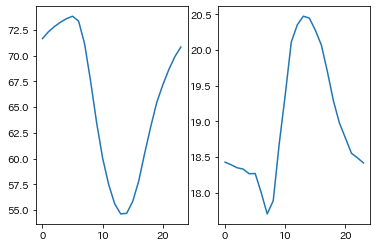

In [269]:
# 体感朝方と夕方に多いのか？日中と夜中は少ないのか？
# どうやら地域差が存在するらしい　東京の夏は夕立が起こりやすいとかなんとか
fig, ax = plt.subplots(nrows=1,ncols=2)
ax[0].plot(table["mean"])
ax[1].plot(table["std"])
plt.show()

In [270]:
# 月時とごとのブレ
# 20~4までは0確定
# 日中ほどブレやすい
print("element:",element)
df = df_weather[condition]
groupby_columns = ["month","hour"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)
table

element: humidity


,month,hour,count,mean,std,min,25%,50%,75%,max
0,1,0,434.0,55.633641,17.861072,23.0,42.0,52.0,66.75,100.0
1,1,1,434.0,55.937788,17.776994,22.0,42.0,52.0,67.00,100.0
2,1,2,434.0,55.661290,17.356286,23.0,42.0,52.0,67.00,100.0
3,1,3,433.0,56.066975,17.096070,25.0,42.0,53.0,67.00,100.0
4,1,4,433.0,56.360277,16.982275,26.0,43.0,54.0,67.00,100.0
...,...,...,...,...,...,...,...,...,...,...
283,12,19,403.0,54.928040,18.436182,21.0,40.0,52.0,66.50,100.0
284,12,20,403.0,56.503722,17.992864,21.0,42.0,53.0,69.00,100.0
285,12,21,403.0,57.779156,18.019154,24.0,44.0,55.0,71.00,100.0
286,12,22,403.0,58.900744,17.914948,25.0,45.0,55.0,71.00,100.0


element: humidity


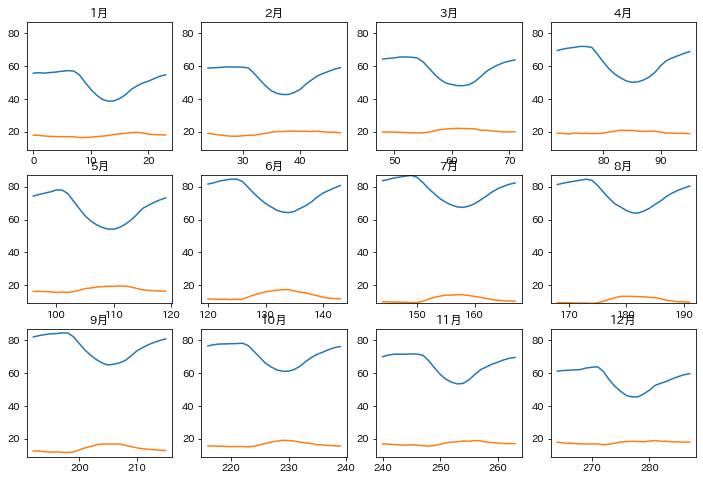

In [271]:
# 季節による差は大きそうですね
print("element:",element)
nrows = 3
ncols = 4
ymin = min(table["mean"].min(),table["std"].min())
ymax = max(table["mean"].max(),table["std"].max())

fig, axes = plt.subplots(nrows=nrows,ncols=ncols, figsize=(12,8))

for month in range(12):
    row = int(month/ncols)
    col = month%ncols
    condition = table["month"] == month+1
    axes[row,col].plot(table.loc[condition,"mean"])
    axes[row,col].plot(table.loc[condition,"std"])
    axes[row,col].set_title(str(month+1)+"月")
    axes[row,col].set_ylim(ymin,ymax)

plt.show()

element: humidity


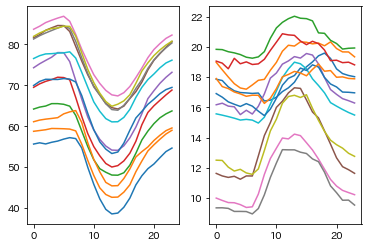

In [272]:
# だいぶぐちゃぐちゃでございますね…
print("element:",element)
fig, ax = plt.subplots(nrows=1,ncols=2)
for month in range(12):
    condition = table["month"] == month+1
    ax[0].plot(table.loc[condition,"mean"].reset_index(drop=True))
    ax[1].plot(table.loc[condition,"std"].reset_index(drop=True))

plt.show()

In [273]:
# 天気がある時間
condition = df_weather["hour"].isin([3,6,9,12,15,18,21])
exist_weather = copy(df_weather[condition])

In [274]:
# 天気ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["weather"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: humidity


In [275]:
# 対応表
weather_sign = {
    1.0: "快晴",
    2.0: "晴れ",
    3.0: "薄雲",
    4.0: "曇り",
    8.0: "霧",
    9.0: "霧雨",
    10.0: "雨",
    11.0: "みぞれ",
    12.0: "雪",
    13.0: "あられ",
    15.0: "雷",
}

In [276]:
# 月時天気ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","weather"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: humidity


In [277]:
# 雲量が関係あるのでしょうか？
print("element:",element)
condition = (table["month"] == 5)
table.loc[condition,["month","hour","weather","count","std"]]

element: humidity


,month,hour,weather,count,std
210,5,3,1.0,109.0,18.548185
211,5,3,2.0,121.0,16.846638
212,5,3,3.0,77.0,12.674092
213,5,3,4.0,219.0,13.691223
214,5,3,9.0,4.0,3.593976
215,5,3,10.0,88.0,8.651615
216,5,3,15.0,1.0,NaN
217,5,6,1.0,99.0,17.384789
218,5,6,2.0,110.0,14.661396
219,5,6,3.0,94.0,13.670369


element: humidity


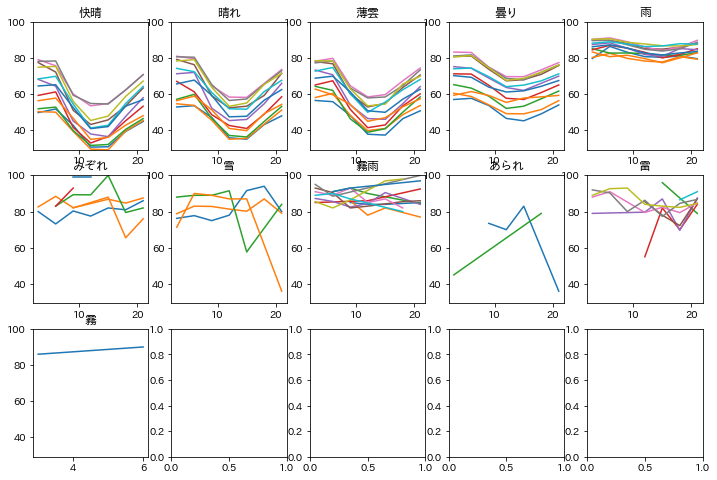

In [278]:
# 定義上、晴れや曇りでは雨降ってないからね。仕方ないね
print("element:",element)

num_glaph = len(table["weather"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,weather in enumerate(table["weather"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["weather"] == weather)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
        ax[row,col].set_title(weather_sign[weather])
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

element: humidity


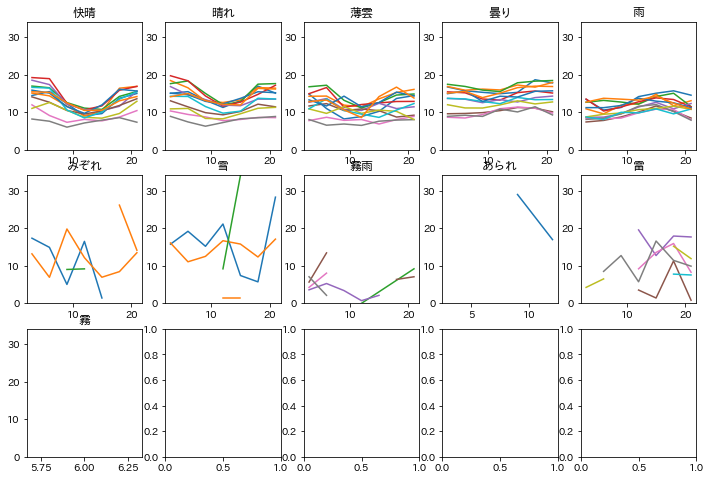

In [279]:
# 定義の曖昧さによるブレなのでは
print("element:",element)

num_glaph = len(table["weather"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,weather in enumerate(table["weather"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["weather"] == weather)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
        ax[row,col].set_title(weather_sign[weather])
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [280]:
# 雲量を0+ → 0, 10- → 10 に変換
df_weather_cloud = copy(df_weather)
search = "([0-9]+)(\+|\-)"
condition_isnull = ~(df_weather["cloud"].isnull())
condition_cloud = df_weather.loc[condition_isnull,"cloud"].map(lambda x: search_object(search,x))
weather_cloud = copy(df_weather[condition_isnull])
weather_cloud.loc[condition_cloud,"cloud"] = \
weather_cloud.loc[condition_cloud,"cloud"].map(lambda x: re.search(search,x).group(1))
df_weather_cloud.loc[condition_isnull,"cloud"] = weather_cloud["cloud"].astype(int)

In [281]:
# 天気がある時間
condition = df_weather_cloud["hour"].isin([3,6,9,12,15,18,21])
exist_weather = copy(df_weather_cloud[condition])

In [282]:
# 月時雲量ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","cloud"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: humidity


In [283]:
# 雲量が関係あるのでしょうか？
print("element:",element)
condition = (table["month"] == 5)
table.loc[condition,["month","hour","cloud","count","std"]]

element: humidity


,month,hour,cloud,count,std
308,5,3,0,100.0,18.468808
309,5,3,1,9.0,16.224981
310,5,3,2,20.0,15.635991
311,5,3,3,27.0,17.059808
312,5,3,4,16.0,20.019990
...,...,...,...,...,...
380,5,21,6,12.0,16.637626
381,5,21,7,22.0,13.329653
382,5,21,8,24.0,10.946428
383,5,21,9,21.0,7.344904


element: humidity


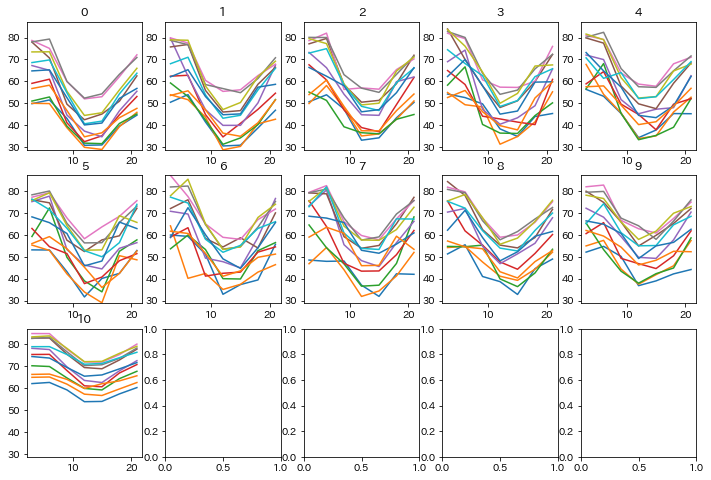

In [284]:
# 定義の曖昧さによるブレなのでは?
print("element:",element)

num_glaph = len(table["cloud"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

    
# 天気ごとの変化はグラフを複数用意
for num,cloud in enumerate(table["cloud"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["cloud"] == cloud)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
        ax[row,col].set_title(cloud)
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

element: humidity


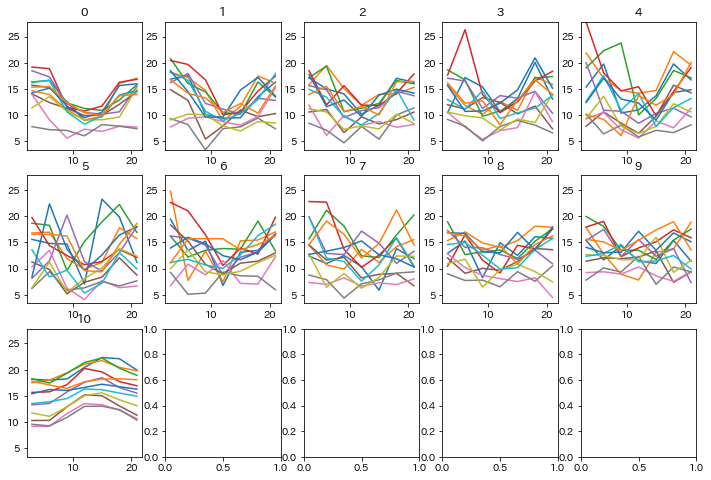

In [285]:
# 定義の曖昧さによるブレなのでは?
print("element:",element)

num_glaph = len(table["cloud"].unique())
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,8))

# 天気ごとの変化はグラフを複数用意
for num,cloud in enumerate(table["cloud"].unique()):
    
    col = num%ncols
    row = int(num/ncols)
    
    # 月ごとの変化は同じグラフ内に
    for month in table["month"].unique():

        condition = (table["month"] == month) & (table["cloud"] == cloud)
        ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
        ax[row,col].set_title(cloud)
        ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [286]:
# 月時天気雲量ごとのブレ
print("element:",element)
df = exist_weather
groupby_columns = ["month","hour","weather","cloud"]
check_column = element
table = check_describe_with_groupby(df,groupby_columns, check_column)

element: humidity


In [287]:
# 雲量が関係あるのでしょうか？
condition = (table["month"] == 5)
table.loc[condition,["month","hour","weather","cloud","count","std"]]

,month,hour,weather,cloud,count,std
473,5,3,1.0,0,100.0,18.468808
474,5,3,1.0,1,9.0,16.224981
475,5,3,2.0,2,20.0,15.635991
476,5,3,2.0,3,27.0,17.059808
477,5,3,2.0,4,16.0,20.019990
...,...,...,...,...,...,...
584,5,21,4.0,9,9.0,8.110350
585,5,21,4.0,10,174.0,14.565717
586,5,21,9.0,10,1.0,NaN
587,5,21,10.0,10,115.0,12.341054


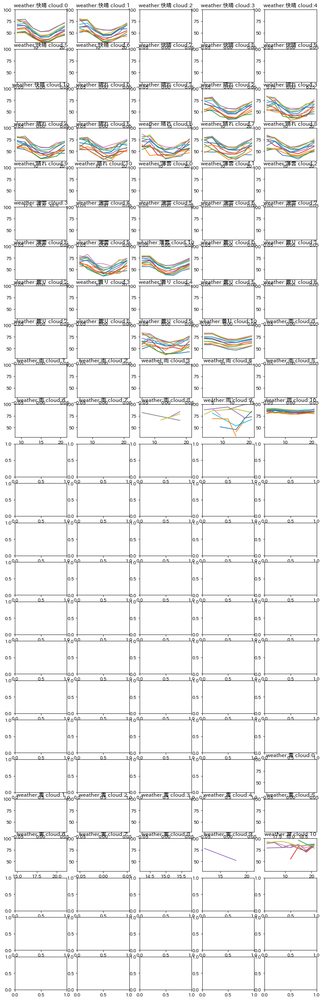

In [288]:
# 定義の曖昧さによるブレなのでは?

num_weather = len(table["weather"].unique())
num_cloud = len(table["cloud"].unique())
num_glaph = num_weather * num_cloud
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["mean"].min()
ymax = table["mean"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,40))

    
# 天気の変化と雲量の変化ごとにグラフを複数用意
for num_w,weather in enumerate(table["weather"].unique()):
    if weather in [8.0,9.0,11.0,12.0,13.0]:
        continue
    
    for num_c,cloud in enumerate(table["cloud"].unique()):
    
        num = num_w * num_cloud + num_c
        col = num%ncols
        row = int(num/ncols)

        # 月ごとの変化は同じグラフ内に
        for month in table["month"].unique():

            condition = (table["month"] == month) & (table["weather"] == weather) & (table["cloud"] == cloud)
            ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"mean"])
            title = "weather:"+str(weather_sign[weather])+" cloud:"+str(cloud)
            ax[row,col].set_title(title)
            ax[row,col].set_ylim(ymin,ymax)

plt.show()

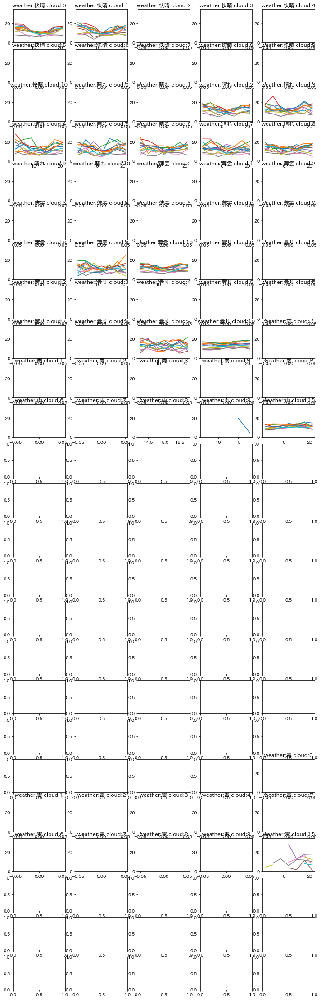

In [289]:
# 定義の曖昧さによるブレなのでは?

num_weather = len(table["weather"].unique())
num_cloud = len(table["cloud"].unique())
num_glaph = num_weather * num_cloud
ncols = 5
nrows = int(num_glaph/ncols+1)
ymin = table["std"].min()
ymax = table["std"].max()

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,40))

    
# 天気の変化と雲量の変化ごとにグラフを複数用意
for num_w,weather in enumerate(table["weather"].unique()):
    if weather in [8.0,9.0,11.0,12.0,13.0]:
        continue
    
    for num_c,cloud in enumerate(table["cloud"].unique()):
    
        num = num_w * num_cloud + num_c
        col = num%ncols
        row = int(num/ncols)

        # 月ごとの変化は同じグラフ内に
        for month in table["month"].unique():

            condition = (table["month"] == month) & (table["weather"] == weather) & (table["cloud"] == cloud)
            ax[row,col].plot(table.loc[condition,"hour"],table.loc[condition,"std"])
            title = "weather:"+str(weather_sign[weather])+" cloud:"+str(cloud)
            ax[row,col].set_title(title)
            ax[row,col].set_ylim(ymin,ymax)

plt.show()

In [290]:
condition = weather["humidity"].isnull()
df_weather.loc[condition]

IndexError: invalid index to scalar variable.

In [ ]:
# 補完？
df_weather["humidity"].isnull().sum()

In [ ]:
# 補完案：
# 同じ月日時の同じ天候で補完するとかが妥当か？

# Weather：天気

単位：[]  
天気図記号に数字が割り当てられている

In [79]:
# 対応表
weather_sign = {
    "1": "快晴",
    "2": "晴れ",
    "3": "薄雲",
    "4": "曇り",
    "8": "霧",
    "9": "霧雨",
    "10": "雨",
    "11": "みぞれ",
    "12": "雪",
    "13": "あられ",
    "15": "雷",
}

In [360]:
# 天気は3時間周期で観測されている（午前0時はお休み）
for i in range(24):
    condition = df_weather["hour"] == i
    print(i,df_weather.loc[condition,"weather"].isnull().sum())

0 7305
1 7305
2 7305
3 0
4 7305
5 7305
6 0
7 7305
8 7305
9 0
10 7305
11 7305
12 0
13 7305
14 7305
15 0
16 7305
17 7305
18 0
19 7305
20 7305
21 0
22 7305
23 7305


In [361]:
# 補完案
# 周辺から滑らかにつなげば？
# 午前0時周辺だけ怪しいけども…？

# Cloud：雲量

単位：[]  
10分比表示　割合の10倍

In [214]:
# 雲量を0+ → 0, 10- → 10 に変換
df_weather_cloud = copy(df_weather)
search = "([0-9]+)(\+|\-)"
condition_isnull = ~(df_weather["cloud"].isnull())
condition_cloud = df_weather.loc[condition_isnull,"cloud"].map(lambda x: search_object(search,x))
weather_cloud = copy(df_weather[condition_isnull])
weather_cloud.loc[condition_cloud,"cloud"] = \
weather_cloud.loc[condition_cloud,"cloud"].map(lambda x: re.search(search,x).group(1))
df_weather_cloud.loc[condition_isnull,"cloud"] = weather_cloud["cloud"].astype(int)

In [363]:
# 雲量も3時間周期で観測されている（午前0時はお休み）
for i in range(24):
    condition = df_weather_cloud["hour"] == i
    print(i,df_weather_cloud.loc[condition,"cloud"].isnull().sum())

0 7305
1 7305
2 7305
3 0
4 7305
5 7305
6 0
7 7305
8 7305
9 0
10 7305
11 7305
12 0
13 7305
14 7305
15 0
16 7305
17 7305
18 0
19 7305
20 7305
21 0
22 7305
23 7305


In [361]:
# 補完案
# 周辺から滑らかにつなげば？
# 午前0時周辺だけ怪しいけども…？